# Testing different ML models to predict gene set scores from surface protein data

In this notebook different reggressors (RandomForestRegressor, GradientBoostingReggressor, CatBoostRegressor) are tested to predict gene set scores from CLR tranformed surface protein data. 

5 common clusters were found in Melsen and Yang (+Crinier) datasets; 

1. Proliferating NK cells
2. CD56dim GZMK-
3. CD56dim GZMK+ (transitional subset between CD56bright and CD56dim NK cells)
4. CD56bright
5. lymhoid tissue-resident NK cells (lt-NK)

Here, gene set for cd56bright NK cells is explored. 


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import anndata as ad
import scvi
import scanpy as sc
import seaborn as sb


from sklearn.model_selection import train_test_split 
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score



Global seed set to 0
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
#markers

#Proliferating
prolif = ['S100A4', 'S100A6', 'KLRC2', 'IL32', 'GZMH', 'GNLY']

#CD56dim GZMK-
cd56dim_gzmk_neg= ['S100A4', 'S100A6', 'ACTB', 'ACTG1', 'CORO1A', 'PFN1', 'GZMB'] #lower expression of GZMB in gzmk_pos cluster, so marker added in this gene set

#CD56dim GZMK+
cd56dim_gzmk_pos = ['GZMK', 'SELL']

#CD56bright
cd56bright= ['NCAM1', 'KIT', 'SELL', 'CD2', 'IL7R', 'KLRC1']
#cd56bright_prot= ['CD56', 'CD62L', "CD2_prot", 'CD127']  #CD117 ab not used in this dataset

#lt-NK
lt_nk= ['CCL3', 'CCL4', 'XCL1', 'GZMK', 'CD160', 'DUSP2', 'CXCR4', 'BTG1']


In [3]:
#loading Neurips dataset
adata_neurips = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad')

In [4]:
adata_neurips

AnnData object with n_obs × n_vars = 80998 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [5]:
adata_neurips.obs['Site'].unique().tolist()

['site4', 'site3', 'site1', 'site2']

In [6]:
#selecting only sites 1 and 4 (good ab signals), from Neurips dataset

eg=adata_neurips[(adata_neurips.obs['Site'] == "site4") | (adata_neurips.obs['Site'] == "site1")].copy() 

In [7]:
eg.obs['Site'].unique().tolist()

['site4', 'site1']

In [8]:
prot=eg.obsm['protein_expression_clr_neurips']

In [9]:
prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,HLA-E,CD82,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15
GTAGTACCAATCCTTT-1-s4d1,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,0.694828,...,1.532575,0.614600,0.900688,1.389844,0.918109,0.0,0.0,0.0,0.0,0.0
CTCAAGAGTCACAGAG-1-s4d1,0.652674,1.069339,1.657770,0.890243,1.377072,1.264995,1.863027,1.101769,1.562259,1.072649,...,1.283465,0.614600,1.786480,0.762359,1.112478,0.0,0.0,0.0,0.0,0.0
CTGTGGGTCATGCGGC-1-s4d1,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,1.013739,...,1.344431,0.353792,0.860303,0.979461,1.147198,0.0,0.0,0.0,0.0,0.0
CGTGATAGTTATCTGG-1-s4d1,0.000000,1.249182,1.335424,1.256332,2.674106,1.322314,0.289336,1.240123,1.397398,1.525053,...,0.859205,1.527772,0.629556,0.854928,1.000442,0.0,0.0,0.0,0.0,0.0
AGATCCAAGATCGGTG-1-s4d1,2.784459,1.132949,1.674846,1.669058,1.663981,2.101246,2.112640,1.417276,1.884321,1.861734,...,1.429432,1.031029,2.808629,2.007436,2.064066,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GTGGTTAGTCGAGTTT-1-s1d3,0.000000,0.175083,0.734526,0.000000,0.505917,1.235054,1.241451,0.512721,0.502246,1.766372,...,0.374154,0.425643,0.519947,0.484666,0.497623,0.0,0.0,0.0,0.0,0.0
GCTACAACAGTGCGCT-1-s1d3,0.378666,0.453643,0.894450,0.000000,0.766577,1.058199,1.529611,0.512721,0.663922,1.766372,...,1.074485,0.100854,1.415230,0.854928,0.560915,0.0,0.0,0.0,0.0,0.0
AACAAAGGTTGGTACT-1-s1d3,0.378666,0.324031,1.094684,0.306698,0.401377,1.983838,2.156735,0.512721,0.835018,2.400949,...,1.149104,1.324148,1.315806,0.605141,0.357584,0.0,0.0,0.0,0.0,0.0
TGACAGTCATGGCTGC-1-s1d3,0.378666,0.764571,0.776968,0.306698,0.152401,1.358780,1.753042,0.201533,0.586348,1.543085,...,1.373575,0.276377,1.113769,0.660339,0.960123,0.0,0.0,0.0,0.0,0.0


In [10]:
prot=prot.rename(columns={'CD2': 'CD2_prot', 'CD83': 'CD83_prot', 'HLA-E': 'HLA-E_prot', 'CX3CR1': 'CX3CR1_prot', 'CD52': 'CD52_prot','CD69': 'CD69_prot', 'CD226':'CD226_prot', 'CD47': 'CD47_prot', 'TIGIT':'TIGIT_prot', 'CD27':'CD27_prot', 'CD38': 'CD38_prot', 'CD224': 'CD224_prot', 'CD7': 'CD7_prot', 'CD44': 'CD44_prot', 'CD34': 'CD34_prot','CD5': 'CD5_prot'})

In [11]:
#some proteins and genes have same names, here _prot added after protein names

a = eg.obs
b = prot

adata_eg=pd.concat([a, b], axis=1)
eg.obs=adata_eg

In [12]:
eg

AnnData object with n_obs × n_vars = 28418 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47_prot', 'CD48', 'CD40', 'CD154', 'CD52_prot', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD1

In [13]:
#selecting only NK cells, gd T cells and ILCs using Neurips annotations

eg_nk = eg[(eg.obs['cell_type'] == "NK") | (eg.obs['cell_type'] == "NK CD158e1+")].copy()   


In [14]:
eg_nk.obs['cell_type'].unique().tolist()

['NK', 'NK CD158e1+']

In [15]:
#This includes now selected cells (NK, ILC, gd T) from site 1 and 4
eg_nk

AnnData object with n_obs × n_vars = 2640 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47_prot', 'CD48', 'CD40', 'CD154', 'CD52_prot', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD16

## Calculating gene scores for gene sets

In [16]:
markers = cd56bright

In [17]:
markers

['NCAM1', 'KIT', 'SELL', 'CD2', 'IL7R', 'KLRC1']

In [18]:
#calculating scores for gene set

sc.tl.score_genes(eg_nk, markers, score_name = 'marker_score')

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


In [19]:
eg_nk.obs['marker_score']

GTAGTACCAATCCTTT-1-s4d1   -0.356433
CTGTGGGTCATGCGGC-1-s4d1   -0.351946
GCAACATTCGCAAGAG-1-s4d1   -0.218289
TCACGGGTCGCACGAC-1-s4d1   -0.301242
CGCCAGAAGACCATTC-1-s4d1   -0.342014
                             ...   
ATCATTCGTCCAATCA-1-s1d3    0.162506
ACATTTCCAGCAGTGA-1-s1d3   -0.127642
TGAGACTTCCTTCAGC-1-s1d3   -0.228768
GAGATGGTCCGCCTAT-1-s1d3   -0.348412
ACCTGTCTCACAGTGT-1-s1d3    0.254791
Name: marker_score, Length: 2640, dtype: float64

In [20]:
prot = eg_nk.obsm['protein_expression_clr_neurips']

In [21]:
prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,HLA-E,CD82,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15
GTAGTACCAATCCTTT-1-s4d1,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,0.694828,...,1.532575,0.614600,0.900688,1.389844,0.918109,0.0,0.0,0.0,0.0,0.0
CTGTGGGTCATGCGGC-1-s4d1,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,1.013739,...,1.344431,0.353792,0.860303,0.979461,1.147198,0.0,0.0,0.0,0.0,0.0
GCAACATTCGCAAGAG-1-s4d1,0.378666,1.192753,1.208881,0.000000,1.456877,1.046035,1.333993,0.638218,1.360894,1.072649,...,1.218539,0.670407,0.329073,1.280509,0.676616,0.0,0.0,0.0,0.0,0.0
TCACGGGTCGCACGAC-1-s4d1,0.000000,0.849902,1.548700,0.730824,1.530781,1.883102,1.686271,1.240123,1.804089,0.812797,...,1.456232,0.614600,0.576253,1.189870,1.000442,0.0,0.0,0.0,0.0,0.0
CGCCAGAAGACCATTC-1-s4d1,0.652674,1.249182,1.404314,0.306698,1.417770,1.664855,1.409627,1.302726,1.663363,0.849218,...,1.556781,0.276377,0.680162,1.415407,0.729806,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATTCGTCCAATCA-1-s1d3,0.000000,0.568367,1.124479,1.027708,0.600556,2.007513,1.679342,0.749707,0.545181,0.288523,...,1.556781,0.353792,0.519947,0.809714,0.357584,0.0,0.0,0.0,0.0,0.0
ACATTTCCAGCAGTGA-1-s1d3,0.000000,0.671273,0.856802,0.000000,0.284617,1.105431,0.818721,0.201533,0.309292,0.652195,...,0.950948,0.555495,0.519947,0.546717,0.194691,0.0,0.0,0.0,0.0,0.0
TGAGACTTCCTTCAGC-1-s1d3,0.000000,0.671273,0.734526,0.306698,0.284617,1.255114,1.174628,0.749707,0.625887,0.406586,...,0.374154,0.492675,0.396827,0.418509,0.000000,0.0,0.0,0.0,0.0,0.0
GAGATGGTCCGCCTAT-1-s1d3,0.000000,0.928521,0.999570,0.541080,0.600556,1.759143,2.420602,1.024682,0.700563,0.406586,...,1.532575,0.555495,0.576253,0.546717,0.430053,0.0,0.0,0.0,0.0,0.0


In [22]:
#dropping columns containing only zeros

prot = prot.loc[:, (prot!=0).any(axis=0)]

In [23]:
prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD94,CD162,CD85j,CD23,CD328,HLA-E,CD82,CD101,CD88,CD224
GTAGTACCAATCCTTT-1-s4d1,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,0.694828,...,2.475005,1.804603,1.069921,1.496785,2.696518,1.532575,0.614600,0.900688,1.389844,0.918109
CTGTGGGTCATGCGGC-1-s4d1,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,1.013739,...,1.408073,1.772872,0.890506,1.188863,2.678422,1.344431,0.353792,0.860303,0.979461,1.147198
GCAACATTCGCAAGAG-1-s4d1,0.378666,1.192753,1.208881,0.000000,1.456877,1.046035,1.333993,0.638218,1.360894,1.072649,...,2.174035,1.013704,1.148843,1.332566,0.000000,1.218539,0.670407,0.329073,1.280509,0.676616
TCACGGGTCGCACGAC-1-s4d1,0.000000,0.849902,1.548700,0.730824,1.530781,1.883102,1.686271,1.240123,1.804089,0.812797,...,3.016060,1.587440,1.623280,1.552023,2.164676,1.456232,0.614600,0.576253,1.189870,1.000442
CGCCAGAAGACCATTC-1-s4d1,0.652674,1.249182,1.404314,0.306698,1.417770,1.664855,1.409627,1.302726,1.663363,0.849218,...,2.826218,2.465725,1.524077,1.637802,3.066941,1.556781,0.276377,0.680162,1.415407,0.729806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATTCGTCCAATCA-1-s1d3,0.000000,0.568367,1.124479,1.027708,0.600556,2.007513,1.679342,0.749707,0.545181,0.288523,...,4.481286,2.345961,0.391222,0.700530,4.391692,1.556781,0.353792,0.519947,0.809714,0.357584
ACATTTCCAGCAGTGA-1-s1d3,0.000000,0.671273,0.856802,0.000000,0.284617,1.105431,0.818721,0.201533,0.309292,0.652195,...,2.122566,1.496074,0.391222,0.410393,2.678422,0.950948,0.555495,0.519947,0.546717,0.194691
TGAGACTTCCTTCAGC-1-s1d3,0.000000,0.671273,0.734526,0.306698,0.284617,1.255114,1.174628,0.749707,0.625887,0.406586,...,0.365443,1.296756,0.214622,0.410393,3.910620,0.374154,0.492675,0.396827,0.418509,0.000000
GAGATGGTCCGCCTAT-1-s1d3,0.000000,0.928521,0.999570,0.541080,0.600556,1.759143,2.420602,1.024682,0.700563,0.406586,...,2.986818,1.976363,0.214622,0.990050,1.800479,1.532575,0.555495,0.576253,0.546717,0.430053


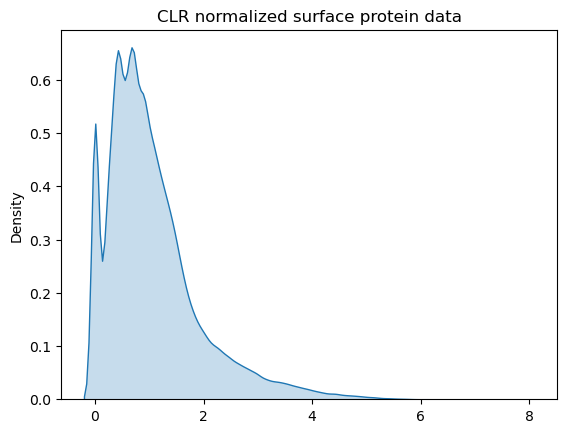

In [24]:
flatten_df = prot.to_numpy().flatten()

sb.kdeplot(flatten_df, fill = True) ; 


plt.title("CLR normalized surface protein data") ;

In [25]:
score_yang = eg_nk.obs['marker_score']

In [26]:
score_yang

GTAGTACCAATCCTTT-1-s4d1   -0.356433
CTGTGGGTCATGCGGC-1-s4d1   -0.351946
GCAACATTCGCAAGAG-1-s4d1   -0.218289
TCACGGGTCGCACGAC-1-s4d1   -0.301242
CGCCAGAAGACCATTC-1-s4d1   -0.342014
                             ...   
ATCATTCGTCCAATCA-1-s1d3    0.162506
ACATTTCCAGCAGTGA-1-s1d3   -0.127642
TGAGACTTCCTTCAGC-1-s1d3   -0.228768
GAGATGGTCCGCCTAT-1-s1d3   -0.348412
ACCTGTCTCACAGTGT-1-s1d3    0.254791
Name: marker_score, Length: 2640, dtype: float64

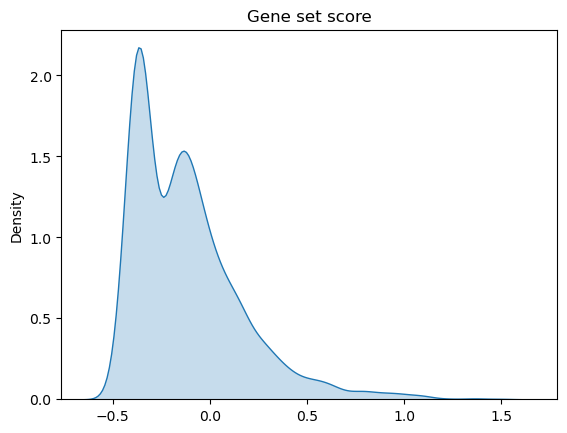

In [27]:
flatten_df1 = score_yang.to_numpy().flatten()

sb.kdeplot(flatten_df1, fill = True) ; 

plt.title("Gene set score") ;

In [28]:
#Creating df containign surface protein data + scores for gene sets

a = score_yang
b = prot

df =pd.concat([a, b], axis=1)


In [29]:
df

,marker_score,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,...,CD94,CD162,CD85j,CD23,CD328,HLA-E,CD82,CD101,CD88,CD224
GTAGTACCAATCCTTT-1-s4d1,-0.356433,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,...,2.475005,1.804603,1.069921,1.496785,2.696518,1.532575,0.614600,0.900688,1.389844,0.918109
CTGTGGGTCATGCGGC-1-s4d1,-0.351946,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,...,1.408073,1.772872,0.890506,1.188863,2.678422,1.344431,0.353792,0.860303,0.979461,1.147198
GCAACATTCGCAAGAG-1-s4d1,-0.218289,0.378666,1.192753,1.208881,0.000000,1.456877,1.046035,1.333993,0.638218,1.360894,...,2.174035,1.013704,1.148843,1.332566,0.000000,1.218539,0.670407,0.329073,1.280509,0.676616
TCACGGGTCGCACGAC-1-s4d1,-0.301242,0.000000,0.849902,1.548700,0.730824,1.530781,1.883102,1.686271,1.240123,1.804089,...,3.016060,1.587440,1.623280,1.552023,2.164676,1.456232,0.614600,0.576253,1.189870,1.000442
CGCCAGAAGACCATTC-1-s4d1,-0.342014,0.652674,1.249182,1.404314,0.306698,1.417770,1.664855,1.409627,1.302726,1.663363,...,2.826218,2.465725,1.524077,1.637802,3.066941,1.556781,0.276377,0.680162,1.415407,0.729806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATTCGTCCAATCA-1-s1d3,0.162506,0.000000,0.568367,1.124479,1.027708,0.600556,2.007513,1.679342,0.749707,0.545181,...,4.481286,2.345961,0.391222,0.700530,4.391692,1.556781,0.353792,0.519947,0.809714,0.357584
ACATTTCCAGCAGTGA-1-s1d3,-0.127642,0.000000,0.671273,0.856802,0.000000,0.284617,1.105431,0.818721,0.201533,0.309292,...,2.122566,1.496074,0.391222,0.410393,2.678422,0.950948,0.555495,0.519947,0.546717,0.194691
TGAGACTTCCTTCAGC-1-s1d3,-0.228768,0.000000,0.671273,0.734526,0.306698,0.284617,1.255114,1.174628,0.749707,0.625887,...,0.365443,1.296756,0.214622,0.410393,3.910620,0.374154,0.492675,0.396827,0.418509,0.000000
GAGATGGTCCGCCTAT-1-s1d3,-0.348412,0.000000,0.928521,0.999570,0.541080,0.600556,1.759143,2.420602,1.024682,0.700563,...,2.986818,1.976363,0.214622,0.990050,1.800479,1.532575,0.555495,0.576253,0.546717,0.430053


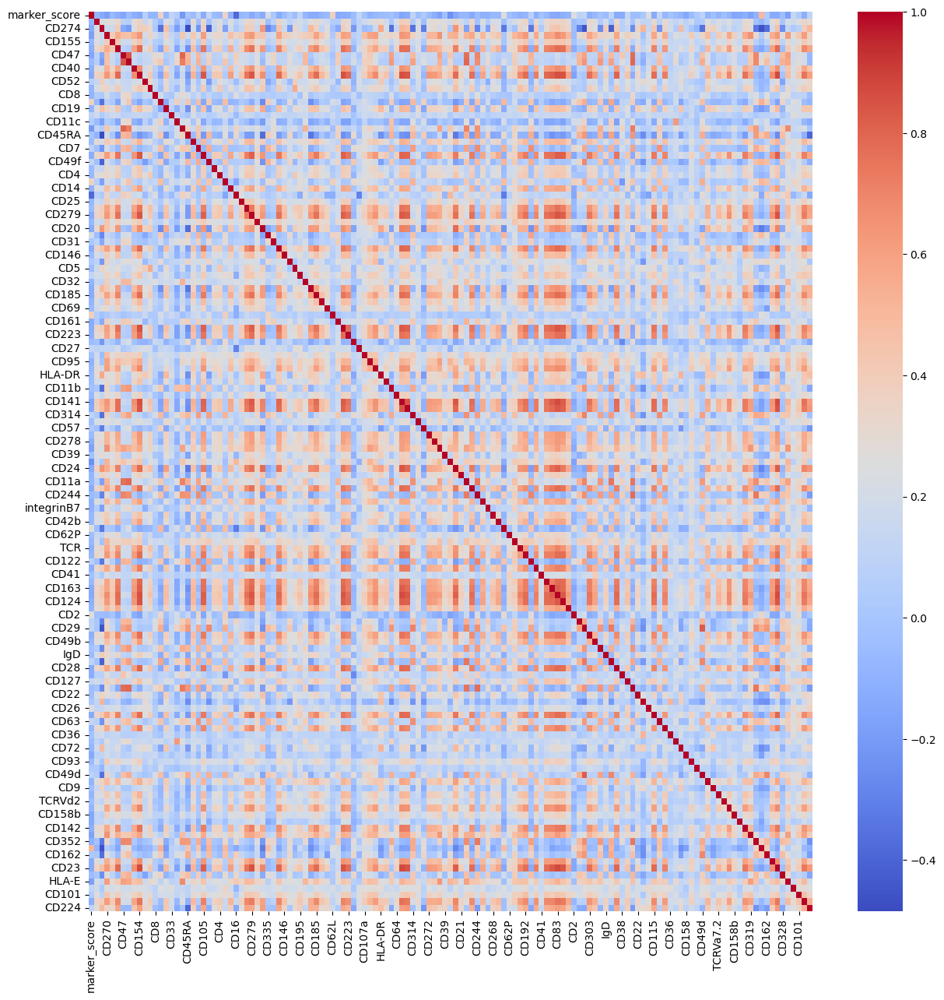

In [30]:
plt.figure(figsize=(15,15))
sb.heatmap(data=df.corr(),cmap='coolwarm')
plt.show()

In [31]:
df

,marker_score,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,...,CD94,CD162,CD85j,CD23,CD328,HLA-E,CD82,CD101,CD88,CD224
GTAGTACCAATCCTTT-1-s4d1,-0.356433,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,...,2.475005,1.804603,1.069921,1.496785,2.696518,1.532575,0.614600,0.900688,1.389844,0.918109
CTGTGGGTCATGCGGC-1-s4d1,-0.351946,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,...,1.408073,1.772872,0.890506,1.188863,2.678422,1.344431,0.353792,0.860303,0.979461,1.147198
GCAACATTCGCAAGAG-1-s4d1,-0.218289,0.378666,1.192753,1.208881,0.000000,1.456877,1.046035,1.333993,0.638218,1.360894,...,2.174035,1.013704,1.148843,1.332566,0.000000,1.218539,0.670407,0.329073,1.280509,0.676616
TCACGGGTCGCACGAC-1-s4d1,-0.301242,0.000000,0.849902,1.548700,0.730824,1.530781,1.883102,1.686271,1.240123,1.804089,...,3.016060,1.587440,1.623280,1.552023,2.164676,1.456232,0.614600,0.576253,1.189870,1.000442
CGCCAGAAGACCATTC-1-s4d1,-0.342014,0.652674,1.249182,1.404314,0.306698,1.417770,1.664855,1.409627,1.302726,1.663363,...,2.826218,2.465725,1.524077,1.637802,3.066941,1.556781,0.276377,0.680162,1.415407,0.729806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATTCGTCCAATCA-1-s1d3,0.162506,0.000000,0.568367,1.124479,1.027708,0.600556,2.007513,1.679342,0.749707,0.545181,...,4.481286,2.345961,0.391222,0.700530,4.391692,1.556781,0.353792,0.519947,0.809714,0.357584
ACATTTCCAGCAGTGA-1-s1d3,-0.127642,0.000000,0.671273,0.856802,0.000000,0.284617,1.105431,0.818721,0.201533,0.309292,...,2.122566,1.496074,0.391222,0.410393,2.678422,0.950948,0.555495,0.519947,0.546717,0.194691
TGAGACTTCCTTCAGC-1-s1d3,-0.228768,0.000000,0.671273,0.734526,0.306698,0.284617,1.255114,1.174628,0.749707,0.625887,...,0.365443,1.296756,0.214622,0.410393,3.910620,0.374154,0.492675,0.396827,0.418509,0.000000
GAGATGGTCCGCCTAT-1-s1d3,-0.348412,0.000000,0.928521,0.999570,0.541080,0.600556,1.759143,2.420602,1.024682,0.700563,...,2.986818,1.976363,0.214622,0.990050,1.800479,1.532575,0.555495,0.576253,0.546717,0.430053


## 1. RandomForestRegressor

In [32]:
#Random forest

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params = {#'bootstrap': [True, False],
 'max_depth': [3,5,7],
 #'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'],
 'min_samples_leaf': [2, 5, 10],
 #'min_samples_split': [2, 5, 10] ,
 #'n_estimators': [10, 50, 100]
}


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(RandomForestRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model = result.best_estimator_
y_pred = best_model.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)
    

Mean squared error: 0.03 R2 score: 0.48


In [33]:
#Mean training scores

print(mean_train_score)

[array([-0.04014919, -0.04034264, -0.04029943, -0.0292051 , -0.02986726,
       -0.03125046, -0.0209144 , -0.02238726, -0.02575419])]


In [34]:
# The best score and parameters

print(result.best_score_)
print(result.best_params_)

-0.04033960350394588
{'max_depth': 7, 'min_samples_leaf': 5}


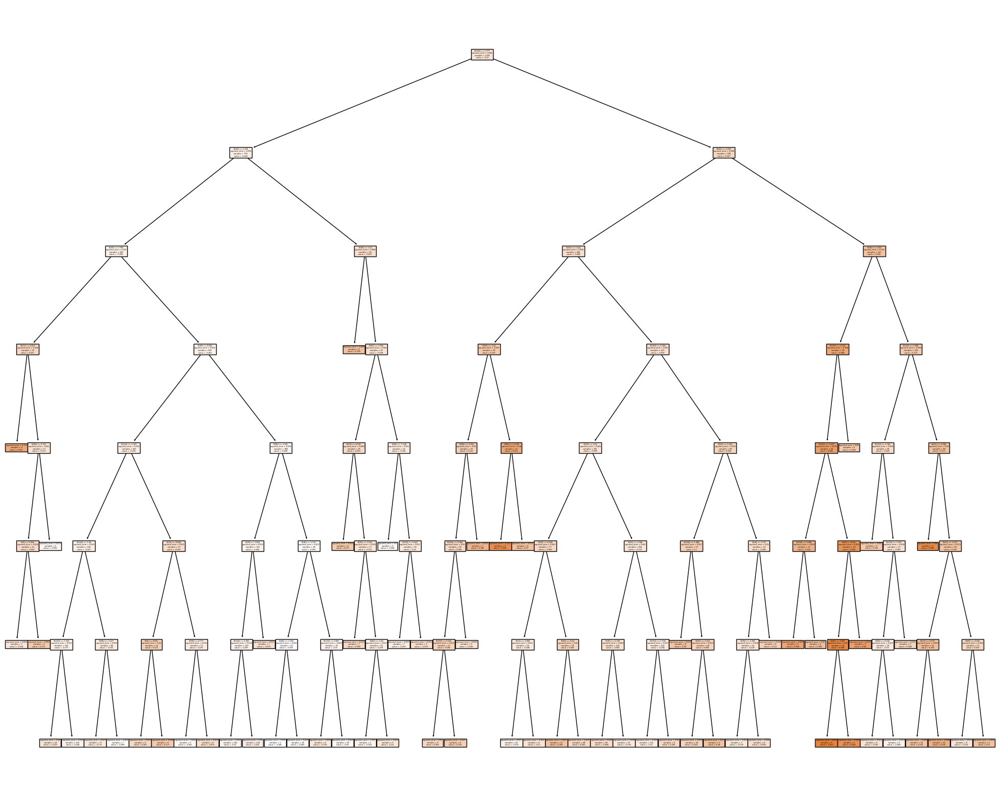

In [35]:
from sklearn import tree

plt.figure(figsize=(25, 20)) # Resize figure
tree.plot_tree(best_model.estimators_[0], filled = True) ;

plt.show()

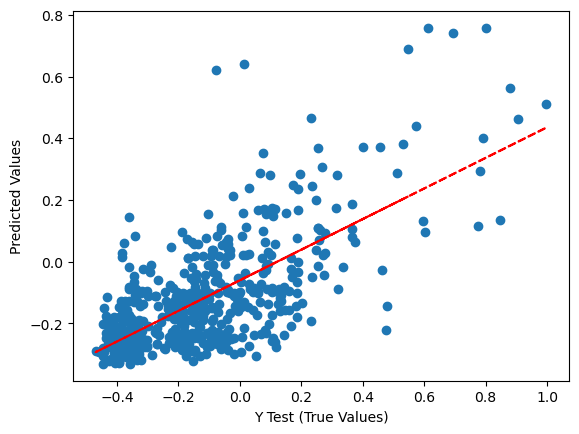

In [36]:
plt.scatter(y_test, y_pred)

# Add a trendline
z = np.polyfit(y_test, y_pred, 1)
p = np.poly1d(z)
plt.plot(y_test, p(y_test), 'r--')
# Add labels
plt.xlabel('Y Test (True Values)')
plt.ylabel('Predicted Values')
plt.show()

<AxesSubplot: xlabel='marker_score', ylabel='Density'>

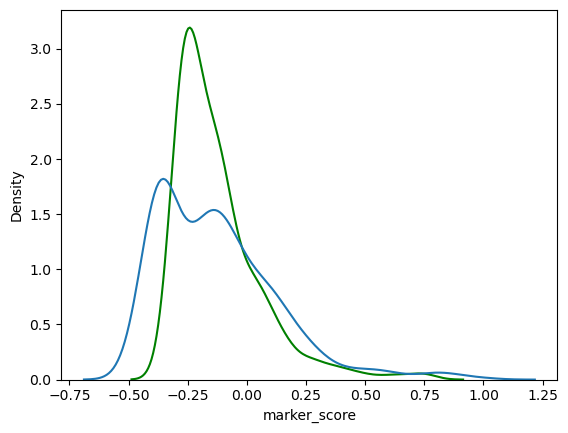

In [37]:
sb.kdeplot(y_pred, color = "g") #predicted values
sb.kdeplot(y_test) #observed values

In [38]:
#Feature importances

importances_rf = best_model.feature_importances_
importances_rf = pd.Series(importances_rf, index=prot.columns)
importances_rf=importances_rf.sort_values(ascending=False)

print(importances_rf.head(10))

CD94         0.339617
CD62L        0.133314
CD16         0.068223
HLA-A-B-C    0.053047
CD352        0.033988
CD56         0.022826
CD44         0.021669
CD45RA       0.017695
CD26         0.012322
CD45         0.011753
dtype: float64


In [39]:
#df from the top 20 important markers
importances_rf=pd.DataFrame(importances_rf)
importances_rf_top=importances_rf[0:20]
importances_rf_top=importances_rf_top.T

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


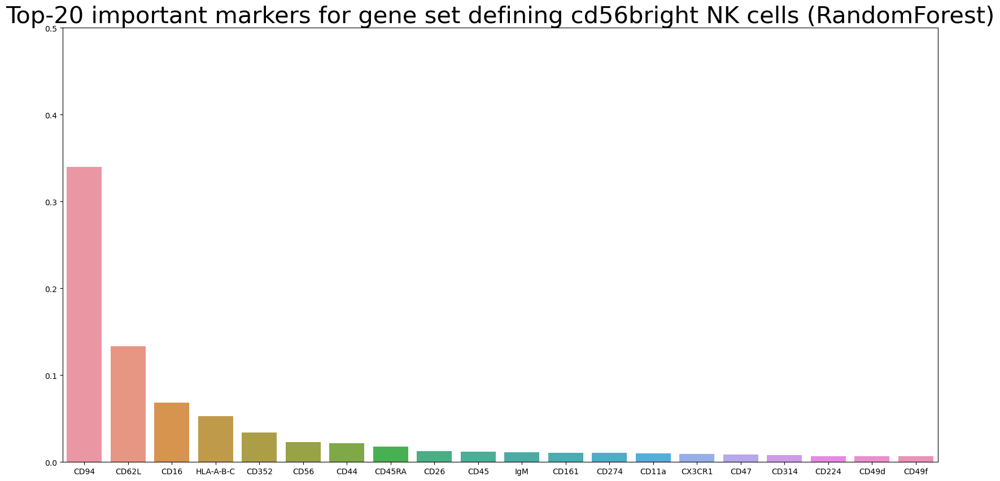

In [55]:
plt.figure(figsize=(20,10))
plt.ylim(0,0.5)
a=sb.barplot(data=importances_rf_top)

plt.title("Top-20 important markers for gene set defining cd56bright NK cells (RandomForest)", fontsize = 30) ;


## 2. Dummy Reggressor

In [41]:
from sklearn.dummy import DummyRegressor

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params =  {'strategy': ["mean", "median"]}


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(DummyRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model_dummy = result.best_estimator_
y_pred = best_model_dummy.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)

Mean squared error: 0.07 R2 score: -0.00


In [42]:
print(mean_train_score)

[array([-0.08258045, -0.08494407])]


## 3. GragientBoostingRegressor

In [43]:
#Gradient boosting regressor

from sklearn.ensemble import GradientBoostingRegressor

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params =  {'max_depth': [3,5,7],
          'min_samples_leaf': [2, 5, 10]}


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(GradientBoostingRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model_gbr = result.best_estimator_
y_pred = best_model_gbr.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)

Mean squared error: 0.03 R2 score: 0.48


In [44]:
print(mean_train_score)

[array([-0.02091463, -0.02075051, -0.02116794, -0.00598359, -0.0063501 ,
       -0.00782763, -0.00061275, -0.00087467, -0.00193578])]


<AxesSubplot: xlabel='marker_score', ylabel='Density'>

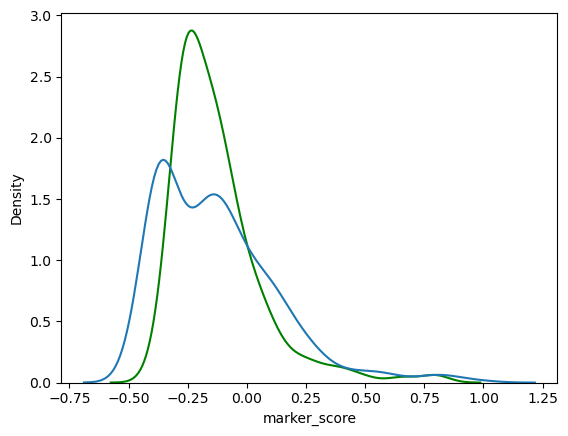

In [45]:
sb.kdeplot(y_pred, color = "g")
sb.kdeplot(y_test)

In [46]:
importances_gbr = best_model_gbr.feature_importances_
importances_gbr = pd.Series(importances_gbr, index=prot.columns)
importances_gbr=importances_gbr.sort_values(ascending=False)

print(importances_gbr.head(10))

CD94         0.326735
CD62L        0.143091
CD16         0.074489
HLA-A-B-C    0.051504
CD44         0.048733
CD352        0.043266
CD56         0.027102
CD45         0.020952
CD11a        0.019734
CD161        0.017265
dtype: float64


In [47]:
#df from the top 20 important markers
importances_gbr=pd.DataFrame(importances_gbr)
importances_gbr_top=importances_gbr[0:20]
importances_gbr_top=importances_gbr_top.T

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


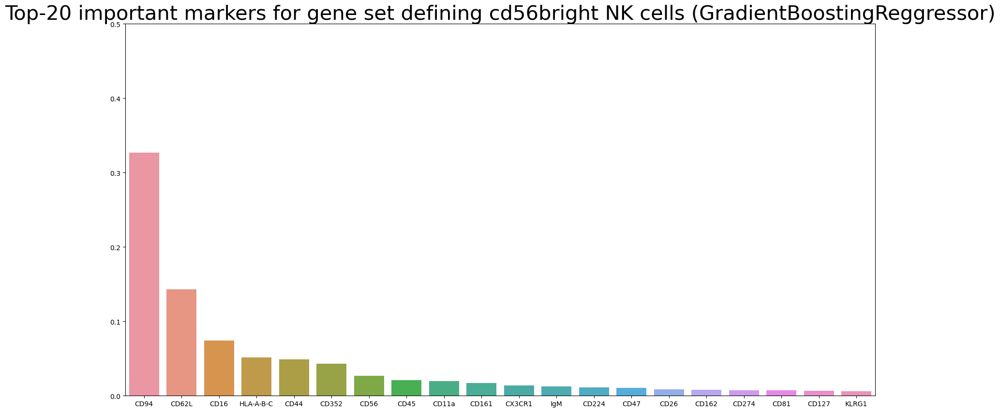

In [56]:
plt.figure(figsize=(20,10))
plt.ylim(0,0.5)
a=sb.barplot(data=importances_gbr_top)

plt.title("Top-20 important markers for gene set defining cd56bright NK cells (GradientBoostingReggressor)", fontsize = 30) ;



## 4. CatBoostRegressor

In [49]:
from catboost import CatBoostRegressor

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params= {'depth': [6,8,10],
        'learning_rate' : [0.01, 0.05, 0.1],
        'iterations'    : [30, 50, 100]
                 }

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(CatBoostRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model_cb = result.best_estimator_
y_pred = best_model_cb.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)

0:	learn: 0.2827267	total: 74.5ms	remaining: 2.16s
1:	learn: 0.2816806	total: 82.7ms	remaining: 1.16s
2:	learn: 0.2808016	total: 87.1ms	remaining: 784ms
3:	learn: 0.2796783	total: 95.7ms	remaining: 622ms
4:	learn: 0.2787140	total: 103ms	remaining: 515ms
5:	learn: 0.2777615	total: 107ms	remaining: 428ms
6:	learn: 0.2767343	total: 114ms	remaining: 375ms
7:	learn: 0.2759202	total: 119ms	remaining: 327ms
8:	learn: 0.2749502	total: 126ms	remaining: 295ms
9:	learn: 0.2739227	total: 135ms	remaining: 269ms
10:	learn: 0.2730070	total: 140ms	remaining: 241ms
11:	learn: 0.2722316	total: 145ms	remaining: 217ms
12:	learn: 0.2712985	total: 151ms	remaining: 197ms
13:	learn: 0.2705473	total: 156ms	remaining: 179ms
14:	learn: 0.2695963	total: 162ms	remaining: 162ms
15:	learn: 0.2686821	total: 168ms	remaining: 147ms
16:	learn: 0.2678897	total: 176ms	remaining: 134ms
17:	learn: 0.2671046	total: 180ms	remaining: 120ms
18:	learn: 0.2662817	total: 187ms	remaining: 108ms
19:	learn: 0.2654658	total: 195ms	rem

0:	learn: 0.2846519	total: 8.67ms	remaining: 251ms
1:	learn: 0.2835878	total: 17.8ms	remaining: 249ms
2:	learn: 0.2826085	total: 22.1ms	remaining: 199ms
3:	learn: 0.2814746	total: 25.1ms	remaining: 163ms
4:	learn: 0.2804152	total: 28.4ms	remaining: 142ms
5:	learn: 0.2793646	total: 31.7ms	remaining: 127ms
6:	learn: 0.2783741	total: 34.8ms	remaining: 114ms
7:	learn: 0.2774608	total: 40.8ms	remaining: 112ms
8:	learn: 0.2765619	total: 49.4ms	remaining: 115ms
9:	learn: 0.2755350	total: 57.5ms	remaining: 115ms
10:	learn: 0.2746241	total: 62ms	remaining: 107ms
11:	learn: 0.2736638	total: 69ms	remaining: 103ms
12:	learn: 0.2727234	total: 73.5ms	remaining: 96.2ms
13:	learn: 0.2718160	total: 81.1ms	remaining: 92.7ms
14:	learn: 0.2709902	total: 89.4ms	remaining: 89.4ms
15:	learn: 0.2701718	total: 94.6ms	remaining: 82.8ms
16:	learn: 0.2692711	total: 102ms	remaining: 77.7ms
17:	learn: 0.2683921	total: 110ms	remaining: 73.3ms
18:	learn: 0.2675502	total: 115ms	remaining: 66.8ms
19:	learn: 0.2667544	t

0:	learn: 0.2848021	total: 8.94ms	remaining: 259ms
1:	learn: 0.2794691	total: 17.2ms	remaining: 241ms
2:	learn: 0.2749465	total: 22.3ms	remaining: 200ms
3:	learn: 0.2703137	total: 29.2ms	remaining: 190ms
4:	learn: 0.2661485	total: 36.1ms	remaining: 180ms
5:	learn: 0.2621268	total: 40ms	remaining: 160ms
6:	learn: 0.2579829	total: 48.3ms	remaining: 159ms
7:	learn: 0.2546274	total: 53.1ms	remaining: 146ms
8:	learn: 0.2513270	total: 60.7ms	remaining: 142ms
9:	learn: 0.2477202	total: 68ms	remaining: 136ms
10:	learn: 0.2445543	total: 73.5ms	remaining: 127ms
11:	learn: 0.2415238	total: 78.9ms	remaining: 118ms
12:	learn: 0.2386934	total: 84.9ms	remaining: 111ms
13:	learn: 0.2363455	total: 92.6ms	remaining: 106ms
14:	learn: 0.2337498	total: 98.9ms	remaining: 98.9ms
15:	learn: 0.2311425	total: 104ms	remaining: 91.2ms
16:	learn: 0.2291084	total: 110ms	remaining: 84.3ms
17:	learn: 0.2268072	total: 116ms	remaining: 77.4ms
18:	learn: 0.2248997	total: 125ms	remaining: 72.6ms
19:	learn: 0.2228726	tota

0:	learn: 0.2848119	total: 7.82ms	remaining: 227ms
1:	learn: 0.2798983	total: 14.9ms	remaining: 209ms
2:	learn: 0.2752238	total: 19.4ms	remaining: 175ms
3:	learn: 0.2705321	total: 24.7ms	remaining: 160ms
4:	learn: 0.2667473	total: 30.4ms	remaining: 152ms
5:	learn: 0.2623702	total: 38.1ms	remaining: 153ms
6:	learn: 0.2581414	total: 44.2ms	remaining: 145ms
7:	learn: 0.2546707	total: 51.3ms	remaining: 141ms
8:	learn: 0.2512605	total: 58.8ms	remaining: 137ms
9:	learn: 0.2477990	total: 67.8ms	remaining: 136ms
10:	learn: 0.2447618	total: 76ms	remaining: 131ms
11:	learn: 0.2416424	total: 80.4ms	remaining: 121ms
12:	learn: 0.2394986	total: 86.7ms	remaining: 113ms
13:	learn: 0.2373672	total: 90.3ms	remaining: 103ms
14:	learn: 0.2348988	total: 98.4ms	remaining: 98.4ms
15:	learn: 0.2320919	total: 107ms	remaining: 93.7ms
16:	learn: 0.2299143	total: 111ms	remaining: 84.8ms
17:	learn: 0.2277495	total: 119ms	remaining: 79ms
18:	learn: 0.2258562	total: 122ms	remaining: 70.6ms
19:	learn: 0.2240509	tota

28:	learn: 0.1882769	total: 217ms	remaining: 7.47ms
29:	learn: 0.1876208	total: 228ms	remaining: 0us
0:	learn: 0.2805595	total: 9.78ms	remaining: 284ms
1:	learn: 0.2708666	total: 14.7ms	remaining: 205ms
2:	learn: 0.2626040	total: 24.8ms	remaining: 224ms
3:	learn: 0.2548877	total: 34.9ms	remaining: 227ms
4:	learn: 0.2481375	total: 44.6ms	remaining: 223ms
5:	learn: 0.2416080	total: 51.2ms	remaining: 205ms
6:	learn: 0.2348033	total: 60.3ms	remaining: 198ms
7:	learn: 0.2307427	total: 71.9ms	remaining: 198ms
8:	learn: 0.2261974	total: 77.1ms	remaining: 180ms
9:	learn: 0.2218620	total: 86.8ms	remaining: 174ms
10:	learn: 0.2179826	total: 94.1ms	remaining: 163ms
11:	learn: 0.2151763	total: 102ms	remaining: 153ms
12:	learn: 0.2124540	total: 110ms	remaining: 144ms
13:	learn: 0.2101753	total: 116ms	remaining: 132ms
14:	learn: 0.2080853	total: 123ms	remaining: 123ms
15:	learn: 0.2058381	total: 132ms	remaining: 115ms
16:	learn: 0.2035848	total: 140ms	remaining: 107ms
17:	learn: 0.2016968	total: 151

2:	learn: 0.2808016	total: 19.5ms	remaining: 305ms
3:	learn: 0.2796783	total: 28.1ms	remaining: 323ms
4:	learn: 0.2787140	total: 33.1ms	remaining: 298ms
5:	learn: 0.2777615	total: 41.8ms	remaining: 307ms
6:	learn: 0.2767343	total: 50ms	remaining: 307ms
7:	learn: 0.2759202	total: 54.8ms	remaining: 288ms
8:	learn: 0.2749502	total: 61.9ms	remaining: 282ms
9:	learn: 0.2739227	total: 66.7ms	remaining: 267ms
10:	learn: 0.2730070	total: 74.3ms	remaining: 264ms
11:	learn: 0.2722316	total: 81ms	remaining: 257ms
12:	learn: 0.2712985	total: 85.6ms	remaining: 244ms
13:	learn: 0.2705473	total: 93.3ms	remaining: 240ms
14:	learn: 0.2695963	total: 99.9ms	remaining: 233ms
15:	learn: 0.2686821	total: 106ms	remaining: 224ms
16:	learn: 0.2678897	total: 114ms	remaining: 220ms
17:	learn: 0.2671046	total: 118ms	remaining: 210ms
18:	learn: 0.2662817	total: 124ms	remaining: 203ms
19:	learn: 0.2654658	total: 129ms	remaining: 194ms
20:	learn: 0.2646187	total: 136ms	remaining: 188ms
21:	learn: 0.2639399	total: 14

28:	learn: 0.2629131	total: 184ms	remaining: 133ms
29:	learn: 0.2621377	total: 194ms	remaining: 129ms
30:	learn: 0.2614390	total: 203ms	remaining: 124ms
31:	learn: 0.2607499	total: 209ms	remaining: 118ms
32:	learn: 0.2599861	total: 216ms	remaining: 111ms
33:	learn: 0.2591862	total: 224ms	remaining: 105ms
34:	learn: 0.2585048	total: 232ms	remaining: 99.5ms
35:	learn: 0.2577956	total: 236ms	remaining: 91.9ms
36:	learn: 0.2570256	total: 244ms	remaining: 85.8ms
37:	learn: 0.2563032	total: 250ms	remaining: 78.9ms
38:	learn: 0.2555375	total: 256ms	remaining: 72.2ms
39:	learn: 0.2548614	total: 264ms	remaining: 65.9ms
40:	learn: 0.2541171	total: 272ms	remaining: 59.8ms
41:	learn: 0.2533900	total: 278ms	remaining: 53ms
42:	learn: 0.2526028	total: 285ms	remaining: 46.5ms
43:	learn: 0.2519503	total: 294ms	remaining: 40.1ms
44:	learn: 0.2512493	total: 301ms	remaining: 33.5ms
45:	learn: 0.2506080	total: 306ms	remaining: 26.6ms
46:	learn: 0.2499535	total: 309ms	remaining: 19.7ms
47:	learn: 0.2492757

0:	learn: 0.2852429	total: 6.49ms	remaining: 318ms
1:	learn: 0.2842573	total: 10.1ms	remaining: 242ms
2:	learn: 0.2833420	total: 13.8ms	remaining: 216ms
3:	learn: 0.2823020	total: 18.1ms	remaining: 208ms
4:	learn: 0.2813441	total: 21.8ms	remaining: 196ms
5:	learn: 0.2804527	total: 24.9ms	remaining: 182ms
6:	learn: 0.2794804	total: 30.5ms	remaining: 187ms
7:	learn: 0.2786299	total: 35.6ms	remaining: 187ms
8:	learn: 0.2777012	total: 42.7ms	remaining: 195ms
9:	learn: 0.2766746	total: 49.5ms	remaining: 198ms
10:	learn: 0.2757629	total: 55.1ms	remaining: 195ms
11:	learn: 0.2748919	total: 60.4ms	remaining: 191ms
12:	learn: 0.2739637	total: 66.7ms	remaining: 190ms
13:	learn: 0.2730898	total: 71.8ms	remaining: 185ms
14:	learn: 0.2722193	total: 79.8ms	remaining: 186ms
15:	learn: 0.2713048	total: 85.9ms	remaining: 182ms
16:	learn: 0.2705105	total: 91.8ms	remaining: 178ms
17:	learn: 0.2697247	total: 99.8ms	remaining: 177ms
18:	learn: 0.2688809	total: 105ms	remaining: 171ms
19:	learn: 0.2681218	to

24:	learn: 0.2117467	total: 157ms	remaining: 157ms
25:	learn: 0.2104183	total: 167ms	remaining: 154ms
26:	learn: 0.2088222	total: 172ms	remaining: 146ms
27:	learn: 0.2076425	total: 180ms	remaining: 142ms
28:	learn: 0.2063182	total: 189ms	remaining: 137ms
29:	learn: 0.2050601	total: 196ms	remaining: 131ms
30:	learn: 0.2039374	total: 201ms	remaining: 123ms
31:	learn: 0.2028293	total: 209ms	remaining: 118ms
32:	learn: 0.2016158	total: 215ms	remaining: 111ms
33:	learn: 0.2007389	total: 220ms	remaining: 104ms
34:	learn: 0.1995466	total: 225ms	remaining: 96.3ms
35:	learn: 0.1985143	total: 232ms	remaining: 90.1ms
36:	learn: 0.1978131	total: 237ms	remaining: 83.4ms
37:	learn: 0.1971352	total: 243ms	remaining: 76.8ms
38:	learn: 0.1961427	total: 249ms	remaining: 70.3ms
39:	learn: 0.1954994	total: 255ms	remaining: 63.6ms
40:	learn: 0.1947691	total: 263ms	remaining: 57.8ms
41:	learn: 0.1940614	total: 272ms	remaining: 51.9ms
42:	learn: 0.1932279	total: 277ms	remaining: 45.2ms
43:	learn: 0.1925228	t

41:	learn: 0.1966313	total: 298ms	remaining: 56.7ms
42:	learn: 0.1955946	total: 307ms	remaining: 49.9ms
43:	learn: 0.1949445	total: 312ms	remaining: 42.5ms
44:	learn: 0.1942140	total: 321ms	remaining: 35.6ms
45:	learn: 0.1935978	total: 326ms	remaining: 28.4ms
46:	learn: 0.1929656	total: 332ms	remaining: 21.2ms
47:	learn: 0.1924524	total: 338ms	remaining: 14.1ms
48:	learn: 0.1919935	total: 344ms	remaining: 7.01ms
49:	learn: 0.1916706	total: 352ms	remaining: 0us
0:	learn: 0.2855223	total: 7.33ms	remaining: 359ms
1:	learn: 0.2803245	total: 10.9ms	remaining: 262ms
2:	learn: 0.2756753	total: 18.6ms	remaining: 292ms
3:	learn: 0.2710947	total: 23ms	remaining: 265ms
4:	learn: 0.2667144	total: 29ms	remaining: 261ms
5:	learn: 0.2628135	total: 33.5ms	remaining: 245ms
6:	learn: 0.2581813	total: 41.3ms	remaining: 253ms
7:	learn: 0.2547170	total: 46.9ms	remaining: 246ms
8:	learn: 0.2514825	total: 53ms	remaining: 241ms
9:	learn: 0.2481265	total: 61ms	remaining: 244ms
10:	learn: 0.2453453	total: 69.6m

14:	learn: 0.2327081	total: 112ms	remaining: 261ms
15:	learn: 0.2302352	total: 117ms	remaining: 249ms
16:	learn: 0.2281373	total: 126ms	remaining: 245ms
17:	learn: 0.2258519	total: 132ms	remaining: 234ms
18:	learn: 0.2237642	total: 139ms	remaining: 227ms
19:	learn: 0.2219633	total: 146ms	remaining: 220ms
20:	learn: 0.2203123	total: 151ms	remaining: 209ms
21:	learn: 0.2183901	total: 158ms	remaining: 201ms
22:	learn: 0.2166713	total: 163ms	remaining: 191ms
23:	learn: 0.2151190	total: 170ms	remaining: 184ms
24:	learn: 0.2134121	total: 176ms	remaining: 176ms
25:	learn: 0.2120850	total: 182ms	remaining: 168ms
26:	learn: 0.2104579	total: 190ms	remaining: 162ms
27:	learn: 0.2093811	total: 199ms	remaining: 156ms
28:	learn: 0.2081812	total: 203ms	remaining: 147ms
29:	learn: 0.2070239	total: 211ms	remaining: 140ms
30:	learn: 0.2058842	total: 217ms	remaining: 133ms
31:	learn: 0.2048997	total: 223ms	remaining: 126ms
32:	learn: 0.2038393	total: 229ms	remaining: 118ms
33:	learn: 0.2027026	total: 235

42:	learn: 0.1733731	total: 302ms	remaining: 49.1ms
43:	learn: 0.1728517	total: 308ms	remaining: 42ms
44:	learn: 0.1722294	total: 317ms	remaining: 35.2ms
45:	learn: 0.1717369	total: 325ms	remaining: 28.3ms
46:	learn: 0.1714041	total: 334ms	remaining: 21.3ms
47:	learn: 0.1710079	total: 339ms	remaining: 14.1ms
48:	learn: 0.1701414	total: 346ms	remaining: 7.06ms
49:	learn: 0.1695634	total: 351ms	remaining: 0us
0:	learn: 0.2781479	total: 7.15ms	remaining: 350ms
1:	learn: 0.2684323	total: 15.5ms	remaining: 373ms
2:	learn: 0.2616289	total: 19.5ms	remaining: 305ms
3:	learn: 0.2535609	total: 26.7ms	remaining: 307ms
4:	learn: 0.2472220	total: 30.4ms	remaining: 274ms
5:	learn: 0.2405094	total: 38ms	remaining: 279ms
6:	learn: 0.2340177	total: 43ms	remaining: 264ms
7:	learn: 0.2300551	total: 49.7ms	remaining: 261ms
8:	learn: 0.2256468	total: 55.9ms	remaining: 254ms
9:	learn: 0.2211817	total: 61ms	remaining: 244ms
10:	learn: 0.2173074	total: 69.1ms	remaining: 245ms
11:	learn: 0.2141806	total: 74.1m

20:	learn: 0.1970653	total: 142ms	remaining: 196ms
21:	learn: 0.1954748	total: 152ms	remaining: 194ms
22:	learn: 0.1941435	total: 158ms	remaining: 186ms
23:	learn: 0.1927843	total: 165ms	remaining: 179ms
24:	learn: 0.1918159	total: 171ms	remaining: 171ms
25:	learn: 0.1907265	total: 177ms	remaining: 164ms
26:	learn: 0.1896553	total: 183ms	remaining: 156ms
27:	learn: 0.1881966	total: 189ms	remaining: 148ms
28:	learn: 0.1867161	total: 195ms	remaining: 141ms
29:	learn: 0.1858827	total: 203ms	remaining: 135ms
30:	learn: 0.1849823	total: 210ms	remaining: 129ms
31:	learn: 0.1844213	total: 217ms	remaining: 122ms
32:	learn: 0.1836169	total: 224ms	remaining: 115ms
33:	learn: 0.1829326	total: 230ms	remaining: 108ms
34:	learn: 0.1819946	total: 237ms	remaining: 102ms
35:	learn: 0.1813017	total: 244ms	remaining: 94.9ms
36:	learn: 0.1806914	total: 251ms	remaining: 88ms
37:	learn: 0.1800948	total: 257ms	remaining: 81.2ms
38:	learn: 0.1797939	total: 263ms	remaining: 74.3ms
39:	learn: 0.1791621	total: 2

48:	learn: 0.1727032	total: 348ms	remaining: 7.09ms
49:	learn: 0.1723332	total: 356ms	remaining: 0us
0:	learn: 0.2800071	total: 7.54ms	remaining: 369ms
1:	learn: 0.2692853	total: 16.5ms	remaining: 396ms
2:	learn: 0.2608800	total: 20.6ms	remaining: 323ms
3:	learn: 0.2532288	total: 28.7ms	remaining: 330ms
4:	learn: 0.2473492	total: 37.4ms	remaining: 336ms
5:	learn: 0.2410283	total: 42.3ms	remaining: 310ms
6:	learn: 0.2348051	total: 50.1ms	remaining: 308ms
7:	learn: 0.2310441	total: 58.6ms	remaining: 307ms
8:	learn: 0.2265112	total: 65.1ms	remaining: 297ms
9:	learn: 0.2223335	total: 71.6ms	remaining: 286ms
10:	learn: 0.2183288	total: 77.5ms	remaining: 275ms
11:	learn: 0.2157550	total: 84ms	remaining: 266ms
12:	learn: 0.2132815	total: 92.3ms	remaining: 263ms
13:	learn: 0.2109369	total: 100ms	remaining: 258ms
14:	learn: 0.2086223	total: 107ms	remaining: 249ms
15:	learn: 0.2061497	total: 113ms	remaining: 240ms
16:	learn: 0.2036868	total: 116ms	remaining: 226ms
17:	learn: 0.2021929	total: 120

70:	learn: 0.2326544	total: 487ms	remaining: 199ms
71:	learn: 0.2321970	total: 492ms	remaining: 191ms
72:	learn: 0.2316370	total: 501ms	remaining: 185ms
73:	learn: 0.2311861	total: 507ms	remaining: 178ms
74:	learn: 0.2307150	total: 516ms	remaining: 172ms
75:	learn: 0.2301951	total: 523ms	remaining: 165ms
76:	learn: 0.2297617	total: 526ms	remaining: 157ms
77:	learn: 0.2293233	total: 533ms	remaining: 150ms
78:	learn: 0.2288188	total: 537ms	remaining: 143ms
79:	learn: 0.2283461	total: 545ms	remaining: 136ms
80:	learn: 0.2277873	total: 550ms	remaining: 129ms
81:	learn: 0.2272901	total: 556ms	remaining: 122ms
82:	learn: 0.2268479	total: 564ms	remaining: 116ms
83:	learn: 0.2264176	total: 570ms	remaining: 109ms
84:	learn: 0.2259332	total: 578ms	remaining: 102ms
85:	learn: 0.2254830	total: 585ms	remaining: 95.3ms
86:	learn: 0.2250151	total: 593ms	remaining: 88.6ms
87:	learn: 0.2245546	total: 598ms	remaining: 81.5ms
88:	learn: 0.2241619	total: 605ms	remaining: 74.8ms
89:	learn: 0.2236587	total:

49:	learn: 0.2485952	total: 325ms	remaining: 325ms
50:	learn: 0.2479349	total: 332ms	remaining: 319ms
51:	learn: 0.2473845	total: 340ms	remaining: 314ms
52:	learn: 0.2467177	total: 348ms	remaining: 308ms
53:	learn: 0.2460624	total: 355ms	remaining: 302ms
54:	learn: 0.2454866	total: 360ms	remaining: 295ms
55:	learn: 0.2448762	total: 369ms	remaining: 290ms
56:	learn: 0.2443635	total: 377ms	remaining: 285ms
57:	learn: 0.2437614	total: 381ms	remaining: 276ms
58:	learn: 0.2431159	total: 390ms	remaining: 271ms
59:	learn: 0.2425267	total: 394ms	remaining: 263ms
60:	learn: 0.2419925	total: 403ms	remaining: 258ms
61:	learn: 0.2413475	total: 408ms	remaining: 250ms
62:	learn: 0.2408040	total: 415ms	remaining: 244ms
63:	learn: 0.2402419	total: 422ms	remaining: 237ms
64:	learn: 0.2397089	total: 428ms	remaining: 230ms
65:	learn: 0.2390994	total: 436ms	remaining: 225ms
66:	learn: 0.2385371	total: 445ms	remaining: 219ms
67:	learn: 0.2380134	total: 454ms	remaining: 214ms
68:	learn: 0.2375173	total: 459

30:	learn: 0.2623334	total: 217ms	remaining: 482ms
31:	learn: 0.2615802	total: 224ms	remaining: 476ms
32:	learn: 0.2607741	total: 232ms	remaining: 471ms
33:	learn: 0.2599259	total: 238ms	remaining: 461ms
34:	learn: 0.2592771	total: 243ms	remaining: 451ms
35:	learn: 0.2585233	total: 251ms	remaining: 445ms
36:	learn: 0.2577826	total: 258ms	remaining: 439ms
37:	learn: 0.2570619	total: 264ms	remaining: 430ms
38:	learn: 0.2562812	total: 270ms	remaining: 422ms
39:	learn: 0.2556661	total: 278ms	remaining: 417ms
40:	learn: 0.2549405	total: 282ms	remaining: 406ms
41:	learn: 0.2543367	total: 290ms	remaining: 401ms
42:	learn: 0.2535561	total: 295ms	remaining: 391ms
43:	learn: 0.2527875	total: 302ms	remaining: 384ms
44:	learn: 0.2520944	total: 308ms	remaining: 376ms
45:	learn: 0.2514188	total: 313ms	remaining: 368ms
46:	learn: 0.2507071	total: 320ms	remaining: 361ms
47:	learn: 0.2500567	total: 326ms	remaining: 353ms
48:	learn: 0.2494515	total: 334ms	remaining: 347ms
49:	learn: 0.2487678	total: 338

94:	learn: 0.2246347	total: 539ms	remaining: 28.3ms
95:	learn: 0.2242719	total: 547ms	remaining: 22.8ms
96:	learn: 0.2238869	total: 552ms	remaining: 17.1ms
97:	learn: 0.2234795	total: 559ms	remaining: 11.4ms
98:	learn: 0.2230802	total: 569ms	remaining: 5.74ms
99:	learn: 0.2227256	total: 575ms	remaining: 0us
0:	learn: 0.2846519	total: 9.2ms	remaining: 910ms
1:	learn: 0.2835878	total: 13.8ms	remaining: 678ms
2:	learn: 0.2826085	total: 19.8ms	remaining: 640ms
3:	learn: 0.2814746	total: 25.1ms	remaining: 603ms
4:	learn: 0.2804152	total: 32.9ms	remaining: 625ms
5:	learn: 0.2793646	total: 36.8ms	remaining: 577ms
6:	learn: 0.2783741	total: 44.7ms	remaining: 594ms
7:	learn: 0.2774608	total: 53.6ms	remaining: 617ms
8:	learn: 0.2765619	total: 58.1ms	remaining: 587ms
9:	learn: 0.2755350	total: 66.6ms	remaining: 600ms
10:	learn: 0.2746241	total: 74.8ms	remaining: 605ms
11:	learn: 0.2736638	total: 80.8ms	remaining: 592ms
12:	learn: 0.2727234	total: 86.3ms	remaining: 577ms
13:	learn: 0.2718160	total

64:	learn: 0.2376636	total: 441ms	remaining: 237ms
65:	learn: 0.2371355	total: 449ms	remaining: 231ms
66:	learn: 0.2366090	total: 460ms	remaining: 227ms
67:	learn: 0.2360587	total: 469ms	remaining: 221ms
68:	learn: 0.2356088	total: 475ms	remaining: 213ms
69:	learn: 0.2350894	total: 481ms	remaining: 206ms
70:	learn: 0.2346308	total: 490ms	remaining: 200ms
71:	learn: 0.2341324	total: 496ms	remaining: 193ms
72:	learn: 0.2335111	total: 503ms	remaining: 186ms
73:	learn: 0.2331094	total: 510ms	remaining: 179ms
74:	learn: 0.2326147	total: 515ms	remaining: 172ms
75:	learn: 0.2322066	total: 523ms	remaining: 165ms
76:	learn: 0.2317345	total: 529ms	remaining: 158ms
77:	learn: 0.2312343	total: 536ms	remaining: 151ms
78:	learn: 0.2307726	total: 545ms	remaining: 145ms
79:	learn: 0.2302768	total: 549ms	remaining: 137ms
80:	learn: 0.2297707	total: 557ms	remaining: 131ms
81:	learn: 0.2293007	total: 562ms	remaining: 123ms
82:	learn: 0.2288354	total: 569ms	remaining: 117ms
83:	learn: 0.2283787	total: 578

39:	learn: 0.2497856	total: 282ms	remaining: 423ms
40:	learn: 0.2490757	total: 291ms	remaining: 418ms
41:	learn: 0.2484089	total: 298ms	remaining: 412ms
42:	learn: 0.2476236	total: 304ms	remaining: 403ms
43:	learn: 0.2470179	total: 312ms	remaining: 398ms
44:	learn: 0.2463537	total: 322ms	remaining: 393ms
45:	learn: 0.2457212	total: 326ms	remaining: 383ms
46:	learn: 0.2450953	total: 333ms	remaining: 376ms
47:	learn: 0.2445048	total: 338ms	remaining: 367ms
48:	learn: 0.2439936	total: 346ms	remaining: 360ms
49:	learn: 0.2433409	total: 355ms	remaining: 355ms
50:	learn: 0.2427973	total: 363ms	remaining: 349ms
51:	learn: 0.2421737	total: 368ms	remaining: 340ms
52:	learn: 0.2416139	total: 376ms	remaining: 333ms
53:	learn: 0.2410317	total: 385ms	remaining: 328ms
54:	learn: 0.2404485	total: 390ms	remaining: 319ms
55:	learn: 0.2398541	total: 399ms	remaining: 313ms
56:	learn: 0.2393588	total: 403ms	remaining: 304ms
57:	learn: 0.2387489	total: 410ms	remaining: 297ms
58:	learn: 0.2381778	total: 416

14:	learn: 0.2317230	total: 107ms	remaining: 604ms
15:	learn: 0.2291673	total: 116ms	remaining: 607ms
16:	learn: 0.2269637	total: 127ms	remaining: 619ms
17:	learn: 0.2246609	total: 133ms	remaining: 607ms
18:	learn: 0.2228265	total: 139ms	remaining: 593ms
19:	learn: 0.2207874	total: 148ms	remaining: 592ms
20:	learn: 0.2188973	total: 157ms	remaining: 590ms
21:	learn: 0.2175736	total: 162ms	remaining: 575ms
22:	learn: 0.2157680	total: 169ms	remaining: 567ms
23:	learn: 0.2141816	total: 179ms	remaining: 567ms
24:	learn: 0.2128499	total: 185ms	remaining: 554ms
25:	learn: 0.2115063	total: 192ms	remaining: 546ms
26:	learn: 0.2099134	total: 196ms	remaining: 530ms
27:	learn: 0.2083441	total: 204ms	remaining: 524ms
28:	learn: 0.2072055	total: 209ms	remaining: 513ms
29:	learn: 0.2059882	total: 216ms	remaining: 504ms
30:	learn: 0.2048234	total: 223ms	remaining: 496ms
31:	learn: 0.2038536	total: 227ms	remaining: 481ms
32:	learn: 0.2026166	total: 234ms	remaining: 475ms
33:	learn: 0.2015913	total: 239

96:	learn: 0.1731241	total: 677ms	remaining: 20.9ms
97:	learn: 0.1728968	total: 686ms	remaining: 14ms
98:	learn: 0.1727444	total: 693ms	remaining: 7ms
99:	learn: 0.1726759	total: 700ms	remaining: 0us
0:	learn: 0.2841598	total: 7.56ms	remaining: 748ms
1:	learn: 0.2790132	total: 12.4ms	remaining: 610ms
2:	learn: 0.2746076	total: 19ms	remaining: 614ms
3:	learn: 0.2700244	total: 23.2ms	remaining: 557ms
4:	learn: 0.2662206	total: 30.4ms	remaining: 577ms
5:	learn: 0.2618610	total: 34.6ms	remaining: 542ms
6:	learn: 0.2571733	total: 42.6ms	remaining: 566ms
7:	learn: 0.2533843	total: 47.2ms	remaining: 542ms
8:	learn: 0.2498191	total: 55.9ms	remaining: 565ms
9:	learn: 0.2462790	total: 60.8ms	remaining: 547ms
10:	learn: 0.2434906	total: 68.3ms	remaining: 552ms
11:	learn: 0.2407078	total: 77ms	remaining: 565ms
12:	learn: 0.2381115	total: 80.6ms	remaining: 540ms
13:	learn: 0.2358719	total: 86.6ms	remaining: 532ms
14:	learn: 0.2334785	total: 92.3ms	remaining: 523ms
15:	learn: 0.2310792	total: 99.1ms

81:	learn: 0.1775684	total: 529ms	remaining: 116ms
82:	learn: 0.1772663	total: 534ms	remaining: 109ms
83:	learn: 0.1769981	total: 542ms	remaining: 103ms
84:	learn: 0.1765843	total: 550ms	remaining: 97.1ms
85:	learn: 0.1763708	total: 559ms	remaining: 90.9ms
86:	learn: 0.1760561	total: 564ms	remaining: 84.3ms
87:	learn: 0.1759300	total: 570ms	remaining: 77.7ms
88:	learn: 0.1754702	total: 577ms	remaining: 71.3ms
89:	learn: 0.1751526	total: 585ms	remaining: 65ms
90:	learn: 0.1749242	total: 590ms	remaining: 58.3ms
91:	learn: 0.1747482	total: 596ms	remaining: 51.9ms
92:	learn: 0.1745140	total: 606ms	remaining: 45.6ms
93:	learn: 0.1744187	total: 610ms	remaining: 38.9ms
94:	learn: 0.1741972	total: 616ms	remaining: 32.4ms
95:	learn: 0.1739030	total: 624ms	remaining: 26ms
96:	learn: 0.1735258	total: 628ms	remaining: 19.4ms
97:	learn: 0.1732550	total: 636ms	remaining: 13ms
98:	learn: 0.1730121	total: 639ms	remaining: 6.46ms
99:	learn: 0.1726841	total: 643ms	remaining: 0us
0:	learn: 0.2831377	tota

63:	learn: 0.1827643	total: 416ms	remaining: 234ms
64:	learn: 0.1824001	total: 423ms	remaining: 228ms
65:	learn: 0.1818218	total: 430ms	remaining: 222ms
66:	learn: 0.1812623	total: 438ms	remaining: 216ms
67:	learn: 0.1808783	total: 443ms	remaining: 208ms
68:	learn: 0.1804750	total: 450ms	remaining: 202ms
69:	learn: 0.1801965	total: 455ms	remaining: 195ms
70:	learn: 0.1798385	total: 460ms	remaining: 188ms
71:	learn: 0.1794987	total: 469ms	remaining: 183ms
72:	learn: 0.1790852	total: 473ms	remaining: 175ms
73:	learn: 0.1788300	total: 481ms	remaining: 169ms
74:	learn: 0.1784530	total: 489ms	remaining: 163ms
75:	learn: 0.1782963	total: 496ms	remaining: 157ms
76:	learn: 0.1779298	total: 501ms	remaining: 150ms
77:	learn: 0.1774179	total: 506ms	remaining: 143ms
78:	learn: 0.1770421	total: 512ms	remaining: 136ms
79:	learn: 0.1765660	total: 517ms	remaining: 129ms
80:	learn: 0.1763699	total: 524ms	remaining: 123ms
81:	learn: 0.1759862	total: 531ms	remaining: 116ms
82:	learn: 0.1755873	total: 536

46:	learn: 0.1940179	total: 304ms	remaining: 343ms
47:	learn: 0.1936950	total: 309ms	remaining: 335ms
48:	learn: 0.1929862	total: 318ms	remaining: 331ms
49:	learn: 0.1922266	total: 328ms	remaining: 328ms
50:	learn: 0.1914964	total: 335ms	remaining: 322ms
51:	learn: 0.1909752	total: 341ms	remaining: 314ms
52:	learn: 0.1904784	total: 349ms	remaining: 310ms
53:	learn: 0.1898117	total: 353ms	remaining: 301ms
54:	learn: 0.1890870	total: 361ms	remaining: 295ms
55:	learn: 0.1884632	total: 365ms	remaining: 287ms
56:	learn: 0.1878144	total: 373ms	remaining: 281ms
57:	learn: 0.1874069	total: 379ms	remaining: 275ms
58:	learn: 0.1868548	total: 385ms	remaining: 267ms
59:	learn: 0.1864908	total: 389ms	remaining: 260ms
60:	learn: 0.1860037	total: 397ms	remaining: 254ms
61:	learn: 0.1855089	total: 405ms	remaining: 248ms
62:	learn: 0.1849511	total: 410ms	remaining: 241ms
63:	learn: 0.1845183	total: 419ms	remaining: 236ms
64:	learn: 0.1838631	total: 428ms	remaining: 231ms
65:	learn: 0.1835783	total: 437

20:	learn: 0.1927897	total: 148ms	remaining: 557ms
21:	learn: 0.1918436	total: 159ms	remaining: 564ms
22:	learn: 0.1906593	total: 168ms	remaining: 561ms
23:	learn: 0.1895045	total: 174ms	remaining: 551ms
24:	learn: 0.1875689	total: 180ms	remaining: 539ms
25:	learn: 0.1867600	total: 189ms	remaining: 537ms
26:	learn: 0.1856205	total: 194ms	remaining: 526ms
27:	learn: 0.1847651	total: 200ms	remaining: 515ms
28:	learn: 0.1837986	total: 209ms	remaining: 512ms
29:	learn: 0.1825521	total: 218ms	remaining: 508ms
30:	learn: 0.1817099	total: 223ms	remaining: 495ms
31:	learn: 0.1809342	total: 230ms	remaining: 489ms
32:	learn: 0.1805784	total: 237ms	remaining: 480ms
33:	learn: 0.1796663	total: 243ms	remaining: 471ms
34:	learn: 0.1788943	total: 251ms	remaining: 466ms
35:	learn: 0.1783276	total: 255ms	remaining: 454ms
36:	learn: 0.1776911	total: 263ms	remaining: 448ms
37:	learn: 0.1770465	total: 270ms	remaining: 440ms
38:	learn: 0.1763934	total: 277ms	remaining: 433ms
39:	learn: 0.1757710	total: 283

0:	learn: 0.2797553	total: 7.89ms	remaining: 781ms
1:	learn: 0.2694376	total: 17.2ms	remaining: 844ms
2:	learn: 0.2615307	total: 22ms	remaining: 712ms
3:	learn: 0.2537456	total: 29.1ms	remaining: 697ms
4:	learn: 0.2470962	total: 34.4ms	remaining: 654ms
5:	learn: 0.2407431	total: 39.8ms	remaining: 624ms
6:	learn: 0.2346273	total: 48.4ms	remaining: 643ms
7:	learn: 0.2309718	total: 57.5ms	remaining: 661ms
8:	learn: 0.2263742	total: 62.5ms	remaining: 632ms
9:	learn: 0.2227511	total: 69.3ms	remaining: 624ms
10:	learn: 0.2189745	total: 75.4ms	remaining: 610ms
11:	learn: 0.2158901	total: 81.9ms	remaining: 601ms
12:	learn: 0.2127638	total: 89.7ms	remaining: 600ms
13:	learn: 0.2104860	total: 95ms	remaining: 583ms
14:	learn: 0.2084582	total: 102ms	remaining: 580ms
15:	learn: 0.2066794	total: 112ms	remaining: 588ms
16:	learn: 0.2045784	total: 117ms	remaining: 571ms
17:	learn: 0.2025292	total: 124ms	remaining: 565ms
18:	learn: 0.2009944	total: 133ms	remaining: 566ms
19:	learn: 0.1995330	total: 139

76:	learn: 0.1607401	total: 543ms	remaining: 162ms
77:	learn: 0.1602023	total: 553ms	remaining: 156ms
78:	learn: 0.1598086	total: 560ms	remaining: 149ms
79:	learn: 0.1589060	total: 566ms	remaining: 142ms
80:	learn: 0.1588316	total: 575ms	remaining: 135ms
81:	learn: 0.1586121	total: 579ms	remaining: 127ms
82:	learn: 0.1579401	total: 587ms	remaining: 120ms
83:	learn: 0.1574997	total: 590ms	remaining: 112ms
84:	learn: 0.1573921	total: 599ms	remaining: 106ms
85:	learn: 0.1571128	total: 604ms	remaining: 98.4ms
86:	learn: 0.1567850	total: 610ms	remaining: 91.1ms
87:	learn: 0.1561217	total: 618ms	remaining: 84.3ms
88:	learn: 0.1554850	total: 625ms	remaining: 77.2ms
89:	learn: 0.1550510	total: 630ms	remaining: 70ms
90:	learn: 0.1543238	total: 635ms	remaining: 62.8ms
91:	learn: 0.1533388	total: 643ms	remaining: 55.9ms
92:	learn: 0.1527147	total: 649ms	remaining: 48.8ms
93:	learn: 0.1519401	total: 655ms	remaining: 41.8ms
94:	learn: 0.1512919	total: 664ms	remaining: 34.9ms
95:	learn: 0.1504293	to

48:	learn: 0.1726867	total: 354ms	remaining: 368ms
49:	learn: 0.1722563	total: 364ms	remaining: 364ms
50:	learn: 0.1717201	total: 371ms	remaining: 357ms
51:	learn: 0.1708914	total: 377ms	remaining: 348ms
52:	learn: 0.1704309	total: 383ms	remaining: 340ms
53:	learn: 0.1699007	total: 389ms	remaining: 332ms
54:	learn: 0.1695562	total: 397ms	remaining: 325ms
55:	learn: 0.1689253	total: 402ms	remaining: 315ms
56:	learn: 0.1686431	total: 409ms	remaining: 308ms
57:	learn: 0.1677825	total: 415ms	remaining: 301ms
58:	learn: 0.1675670	total: 423ms	remaining: 294ms
59:	learn: 0.1668322	total: 431ms	remaining: 287ms
60:	learn: 0.1661135	total: 435ms	remaining: 278ms
61:	learn: 0.1658979	total: 442ms	remaining: 271ms
62:	learn: 0.1653678	total: 446ms	remaining: 262ms
63:	learn: 0.1649548	total: 457ms	remaining: 257ms
64:	learn: 0.1645642	total: 464ms	remaining: 250ms
65:	learn: 0.1642545	total: 470ms	remaining: 242ms
66:	learn: 0.1638466	total: 478ms	remaining: 236ms
67:	learn: 0.1634515	total: 485

32:	learn: 0.1824535	total: 222ms	remaining: 450ms
33:	learn: 0.1815506	total: 232ms	remaining: 451ms
34:	learn: 0.1807373	total: 241ms	remaining: 448ms
35:	learn: 0.1797576	total: 250ms	remaining: 444ms
36:	learn: 0.1791638	total: 257ms	remaining: 437ms
37:	learn: 0.1785360	total: 262ms	remaining: 428ms
38:	learn: 0.1780295	total: 271ms	remaining: 424ms
39:	learn: 0.1773037	total: 276ms	remaining: 413ms
40:	learn: 0.1769502	total: 283ms	remaining: 408ms
41:	learn: 0.1763736	total: 290ms	remaining: 400ms
42:	learn: 0.1755766	total: 296ms	remaining: 392ms
43:	learn: 0.1751177	total: 302ms	remaining: 385ms
44:	learn: 0.1742864	total: 308ms	remaining: 377ms
45:	learn: 0.1738825	total: 317ms	remaining: 372ms
46:	learn: 0.1734147	total: 326ms	remaining: 367ms
47:	learn: 0.1732022	total: 333ms	remaining: 361ms
48:	learn: 0.1727032	total: 339ms	remaining: 353ms
49:	learn: 0.1723332	total: 348ms	remaining: 348ms
50:	learn: 0.1719338	total: 355ms	remaining: 341ms
51:	learn: 0.1710251	total: 360

6:	learn: 0.2311100	total: 44.3ms	remaining: 588ms
7:	learn: 0.2272842	total: 53.6ms	remaining: 616ms
8:	learn: 0.2229620	total: 59.4ms	remaining: 601ms
9:	learn: 0.2186185	total: 67.2ms	remaining: 605ms
10:	learn: 0.2154756	total: 75.8ms	remaining: 614ms
11:	learn: 0.2128190	total: 79.7ms	remaining: 584ms
12:	learn: 0.2107549	total: 82.8ms	remaining: 554ms
13:	learn: 0.2080900	total: 86ms	remaining: 528ms
14:	learn: 0.2062749	total: 89.3ms	remaining: 506ms
15:	learn: 0.2043909	total: 92.8ms	remaining: 487ms
16:	learn: 0.2022626	total: 96.2ms	remaining: 470ms
17:	learn: 0.2003693	total: 102ms	remaining: 464ms
18:	learn: 0.1989405	total: 105ms	remaining: 449ms
19:	learn: 0.1972181	total: 113ms	remaining: 450ms
20:	learn: 0.1957570	total: 121ms	remaining: 456ms
21:	learn: 0.1941053	total: 125ms	remaining: 444ms
22:	learn: 0.1929741	total: 134ms	remaining: 448ms
23:	learn: 0.1916401	total: 140ms	remaining: 443ms
24:	learn: 0.1902681	total: 147ms	remaining: 440ms
25:	learn: 0.1893970	total

8:	learn: 0.2807595	total: 127ms	remaining: 297ms
9:	learn: 0.2798401	total: 142ms	remaining: 283ms
10:	learn: 0.2789882	total: 154ms	remaining: 265ms
11:	learn: 0.2780365	total: 166ms	remaining: 249ms
12:	learn: 0.2771150	total: 180ms	remaining: 235ms
13:	learn: 0.2762072	total: 192ms	remaining: 219ms
14:	learn: 0.2753844	total: 206ms	remaining: 206ms
15:	learn: 0.2744418	total: 219ms	remaining: 192ms
16:	learn: 0.2735764	total: 232ms	remaining: 177ms
17:	learn: 0.2726805	total: 247ms	remaining: 165ms
18:	learn: 0.2718190	total: 260ms	remaining: 150ms
19:	learn: 0.2709827	total: 275ms	remaining: 138ms
20:	learn: 0.2700974	total: 290ms	remaining: 124ms
21:	learn: 0.2693454	total: 303ms	remaining: 110ms
22:	learn: 0.2685098	total: 317ms	remaining: 96.4ms
23:	learn: 0.2677009	total: 330ms	remaining: 82.5ms
24:	learn: 0.2669600	total: 343ms	remaining: 68.6ms
25:	learn: 0.2661348	total: 356ms	remaining: 54.8ms
26:	learn: 0.2654320	total: 368ms	remaining: 40.9ms
27:	learn: 0.2645650	total: 

1:	learn: 0.2876931	total: 40.2ms	remaining: 563ms
2:	learn: 0.2866595	total: 59.3ms	remaining: 534ms
3:	learn: 0.2857717	total: 70.3ms	remaining: 457ms
4:	learn: 0.2848601	total: 83ms	remaining: 415ms
5:	learn: 0.2838506	total: 96.8ms	remaining: 387ms
6:	learn: 0.2828285	total: 109ms	remaining: 357ms
7:	learn: 0.2817737	total: 122ms	remaining: 336ms
8:	learn: 0.2808885	total: 136ms	remaining: 317ms
9:	learn: 0.2800323	total: 150ms	remaining: 300ms
10:	learn: 0.2790637	total: 164ms	remaining: 284ms
11:	learn: 0.2781454	total: 177ms	remaining: 265ms
12:	learn: 0.2771338	total: 191ms	remaining: 250ms
13:	learn: 0.2762575	total: 204ms	remaining: 233ms
14:	learn: 0.2753390	total: 217ms	remaining: 217ms
15:	learn: 0.2744215	total: 229ms	remaining: 201ms
16:	learn: 0.2735650	total: 243ms	remaining: 186ms
17:	learn: 0.2726372	total: 257ms	remaining: 171ms
18:	learn: 0.2717895	total: 271ms	remaining: 157ms
19:	learn: 0.2709580	total: 285ms	remaining: 142ms
20:	learn: 0.2701187	total: 298ms	rem

12:	learn: 0.2376227	total: 281ms	remaining: 367ms
13:	learn: 0.2350676	total: 308ms	remaining: 352ms
14:	learn: 0.2326644	total: 321ms	remaining: 321ms
15:	learn: 0.2301512	total: 345ms	remaining: 302ms
16:	learn: 0.2278694	total: 365ms	remaining: 279ms
17:	learn: 0.2255584	total: 382ms	remaining: 254ms
18:	learn: 0.2234372	total: 405ms	remaining: 234ms
19:	learn: 0.2214665	total: 421ms	remaining: 211ms
20:	learn: 0.2194341	total: 438ms	remaining: 188ms
21:	learn: 0.2173271	total: 452ms	remaining: 164ms
22:	learn: 0.2156811	total: 475ms	remaining: 145ms
23:	learn: 0.2143035	total: 484ms	remaining: 121ms
24:	learn: 0.2127432	total: 495ms	remaining: 98.9ms
25:	learn: 0.2107995	total: 507ms	remaining: 77.9ms
26:	learn: 0.2090348	total: 529ms	remaining: 58.8ms
27:	learn: 0.2074922	total: 540ms	remaining: 38.6ms
28:	learn: 0.2062599	total: 562ms	remaining: 19.4ms
29:	learn: 0.2046775	total: 580ms	remaining: 0us
0:	learn: 0.2854303	total: 29.7ms	remaining: 860ms
1:	learn: 0.2803293	total: 4

29:	learn: 0.2054734	total: 607ms	remaining: 0us
0:	learn: 0.2780801	total: 21ms	remaining: 608ms
1:	learn: 0.2732376	total: 38ms	remaining: 533ms
2:	learn: 0.2684396	total: 62.5ms	remaining: 563ms
3:	learn: 0.2646113	total: 75ms	remaining: 488ms
4:	learn: 0.2606508	total: 96ms	remaining: 480ms
5:	learn: 0.2565227	total: 120ms	remaining: 479ms
6:	learn: 0.2526914	total: 137ms	remaining: 451ms
7:	learn: 0.2489064	total: 154ms	remaining: 423ms
8:	learn: 0.2456793	total: 174ms	remaining: 407ms
9:	learn: 0.2427024	total: 194ms	remaining: 387ms
10:	learn: 0.2394599	total: 218ms	remaining: 376ms
11:	learn: 0.2365671	total: 243ms	remaining: 365ms
12:	learn: 0.2339949	total: 254ms	remaining: 332ms
13:	learn: 0.2318725	total: 278ms	remaining: 318ms
14:	learn: 0.2290295	total: 304ms	remaining: 304ms
15:	learn: 0.2266313	total: 315ms	remaining: 276ms
16:	learn: 0.2244440	total: 337ms	remaining: 258ms
17:	learn: 0.2221869	total: 355ms	remaining: 237ms
18:	learn: 0.2201375	total: 377ms	remaining: 2

19:	learn: 0.1926782	total: 356ms	remaining: 178ms
20:	learn: 0.1906324	total: 381ms	remaining: 163ms
21:	learn: 0.1887195	total: 408ms	remaining: 149ms
22:	learn: 0.1869194	total: 425ms	remaining: 129ms
23:	learn: 0.1857529	total: 444ms	remaining: 111ms
24:	learn: 0.1841067	total: 467ms	remaining: 93.3ms
25:	learn: 0.1821835	total: 479ms	remaining: 73.7ms
26:	learn: 0.1812851	total: 500ms	remaining: 55.5ms
27:	learn: 0.1796942	total: 523ms	remaining: 37.4ms
28:	learn: 0.1788915	total: 535ms	remaining: 18.4ms
29:	learn: 0.1777816	total: 558ms	remaining: 0us
0:	learn: 0.2782272	total: 31.3ms	remaining: 907ms
1:	learn: 0.2690582	total: 48.7ms	remaining: 681ms
2:	learn: 0.2596456	total: 76.2ms	remaining: 686ms
3:	learn: 0.2528653	total: 100ms	remaining: 650ms
4:	learn: 0.2464819	total: 121ms	remaining: 605ms
5:	learn: 0.2402020	total: 150ms	remaining: 601ms
6:	learn: 0.2337272	total: 180ms	remaining: 592ms
7:	learn: 0.2291637	total: 208ms	remaining: 573ms
8:	learn: 0.2249996	total: 240ms	

4:	learn: 0.2787184	total: 123ms	remaining: 1.11s
5:	learn: 0.2778233	total: 137ms	remaining: 1s
6:	learn: 0.2768472	total: 151ms	remaining: 931ms
7:	learn: 0.2759289	total: 167ms	remaining: 875ms
8:	learn: 0.2750908	total: 191ms	remaining: 872ms
9:	learn: 0.2740744	total: 208ms	remaining: 831ms
10:	learn: 0.2731553	total: 224ms	remaining: 794ms
11:	learn: 0.2722113	total: 232ms	remaining: 736ms
12:	learn: 0.2713095	total: 241ms	remaining: 686ms
13:	learn: 0.2705246	total: 252ms	remaining: 648ms
14:	learn: 0.2696173	total: 268ms	remaining: 625ms
15:	learn: 0.2688212	total: 284ms	remaining: 604ms
16:	learn: 0.2679454	total: 309ms	remaining: 599ms
17:	learn: 0.2670215	total: 321ms	remaining: 570ms
18:	learn: 0.2662013	total: 343ms	remaining: 560ms
19:	learn: 0.2653955	total: 370ms	remaining: 555ms
20:	learn: 0.2645117	total: 386ms	remaining: 533ms
21:	learn: 0.2637065	total: 403ms	remaining: 513ms
22:	learn: 0.2629253	total: 423ms	remaining: 496ms
23:	learn: 0.2621111	total: 435ms	remain

24:	learn: 0.2662732	total: 453ms	remaining: 453ms
25:	learn: 0.2654478	total: 476ms	remaining: 439ms
26:	learn: 0.2645922	total: 486ms	remaining: 414ms
27:	learn: 0.2636841	total: 509ms	remaining: 400ms
28:	learn: 0.2628804	total: 527ms	remaining: 382ms
29:	learn: 0.2621418	total: 542ms	remaining: 361ms
30:	learn: 0.2614309	total: 565ms	remaining: 346ms
31:	learn: 0.2606958	total: 580ms	remaining: 326ms
32:	learn: 0.2599295	total: 598ms	remaining: 308ms
33:	learn: 0.2591318	total: 613ms	remaining: 288ms
34:	learn: 0.2584368	total: 629ms	remaining: 270ms
35:	learn: 0.2577405	total: 654ms	remaining: 254ms
36:	learn: 0.2569480	total: 679ms	remaining: 239ms
37:	learn: 0.2562517	total: 704ms	remaining: 222ms
38:	learn: 0.2556112	total: 719ms	remaining: 203ms
39:	learn: 0.2548850	total: 736ms	remaining: 184ms
40:	learn: 0.2541388	total: 759ms	remaining: 167ms
41:	learn: 0.2534733	total: 786ms	remaining: 150ms
42:	learn: 0.2527796	total: 798ms	remaining: 130ms
43:	learn: 0.2521461	total: 820

37:	learn: 0.2528260	total: 805ms	remaining: 254ms
38:	learn: 0.2521356	total: 829ms	remaining: 234ms
39:	learn: 0.2514969	total: 838ms	remaining: 210ms
40:	learn: 0.2507199	total: 847ms	remaining: 186ms
41:	learn: 0.2500952	total: 858ms	remaining: 163ms
42:	learn: 0.2494138	total: 885ms	remaining: 144ms
43:	learn: 0.2488586	total: 896ms	remaining: 122ms
44:	learn: 0.2481865	total: 921ms	remaining: 102ms
45:	learn: 0.2475162	total: 946ms	remaining: 82.3ms
46:	learn: 0.2468982	total: 965ms	remaining: 61.6ms
47:	learn: 0.2462811	total: 991ms	remaining: 41.3ms
48:	learn: 0.2456056	total: 1.02s	remaining: 20.9ms
49:	learn: 0.2449257	total: 1.03s	remaining: 0us
0:	learn: 0.2852296	total: 41.6ms	remaining: 2.04s
1:	learn: 0.2842095	total: 81.8ms	remaining: 1.96s
2:	learn: 0.2831204	total: 99.9ms	remaining: 1.56s
3:	learn: 0.2821936	total: 122ms	remaining: 1.4s
4:	learn: 0.2812280	total: 150ms	remaining: 1.35s
5:	learn: 0.2802593	total: 184ms	remaining: 1.35s
6:	learn: 0.2792973	total: 208ms	

6:	learn: 0.2532810	total: 148ms	remaining: 908ms
7:	learn: 0.2500517	total: 174ms	remaining: 911ms
8:	learn: 0.2469085	total: 187ms	remaining: 853ms
9:	learn: 0.2435637	total: 206ms	remaining: 824ms
10:	learn: 0.2401990	total: 230ms	remaining: 814ms
11:	learn: 0.2371306	total: 247ms	remaining: 781ms
12:	learn: 0.2339154	total: 273ms	remaining: 778ms
13:	learn: 0.2315575	total: 304ms	remaining: 781ms
14:	learn: 0.2290801	total: 343ms	remaining: 799ms
15:	learn: 0.2266684	total: 358ms	remaining: 761ms
16:	learn: 0.2246829	total: 396ms	remaining: 768ms
17:	learn: 0.2223824	total: 411ms	remaining: 731ms
18:	learn: 0.2204104	total: 439ms	remaining: 716ms
19:	learn: 0.2181832	total: 454ms	remaining: 681ms
20:	learn: 0.2160410	total: 471ms	remaining: 651ms
21:	learn: 0.2143700	total: 489ms	remaining: 623ms
22:	learn: 0.2125277	total: 506ms	remaining: 595ms
23:	learn: 0.2111138	total: 526ms	remaining: 569ms
24:	learn: 0.2094781	total: 542ms	remaining: 542ms
25:	learn: 0.2078884	total: 566ms	r

22:	learn: 0.2156811	total: 460ms	remaining: 540ms
23:	learn: 0.2143035	total: 479ms	remaining: 519ms
24:	learn: 0.2127432	total: 495ms	remaining: 495ms
25:	learn: 0.2107995	total: 520ms	remaining: 480ms
26:	learn: 0.2090348	total: 533ms	remaining: 454ms
27:	learn: 0.2074922	total: 555ms	remaining: 436ms
28:	learn: 0.2062599	total: 568ms	remaining: 412ms
29:	learn: 0.2046775	total: 589ms	remaining: 392ms
30:	learn: 0.2033288	total: 602ms	remaining: 369ms
31:	learn: 0.2023276	total: 624ms	remaining: 351ms
32:	learn: 0.2012902	total: 648ms	remaining: 334ms
33:	learn: 0.2002104	total: 659ms	remaining: 310ms
34:	learn: 0.1989834	total: 684ms	remaining: 293ms
35:	learn: 0.1978525	total: 694ms	remaining: 270ms
36:	learn: 0.1968563	total: 705ms	remaining: 248ms
37:	learn: 0.1958931	total: 718ms	remaining: 227ms
38:	learn: 0.1948414	total: 739ms	remaining: 209ms
39:	learn: 0.1939349	total: 757ms	remaining: 189ms
40:	learn: 0.1931414	total: 776ms	remaining: 170ms
41:	learn: 0.1922095	total: 794

36:	learn: 0.1926848	total: 697ms	remaining: 245ms
37:	learn: 0.1916081	total: 724ms	remaining: 229ms
38:	learn: 0.1905579	total: 749ms	remaining: 211ms
39:	learn: 0.1899422	total: 762ms	remaining: 191ms
40:	learn: 0.1888889	total: 788ms	remaining: 173ms
41:	learn: 0.1880715	total: 802ms	remaining: 153ms
42:	learn: 0.1869498	total: 819ms	remaining: 133ms
43:	learn: 0.1860511	total: 847ms	remaining: 115ms
44:	learn: 0.1847721	total: 870ms	remaining: 96.7ms
45:	learn: 0.1837762	total: 881ms	remaining: 76.6ms
46:	learn: 0.1832209	total: 905ms	remaining: 57.8ms
47:	learn: 0.1822859	total: 934ms	remaining: 38.9ms
48:	learn: 0.1814512	total: 950ms	remaining: 19.4ms
49:	learn: 0.1805568	total: 973ms	remaining: 0us
0:	learn: 0.2813375	total: 22.5ms	remaining: 1.1s
1:	learn: 0.2764831	total: 46.7ms	remaining: 1.12s
2:	learn: 0.2716456	total: 73ms	remaining: 1.14s
3:	learn: 0.2676576	total: 84.5ms	remaining: 972ms
4:	learn: 0.2633812	total: 109ms	remaining: 984ms
5:	learn: 0.2589743	total: 135ms

0:	learn: 0.2742836	total: 20.7ms	remaining: 1.02s
1:	learn: 0.2655300	total: 37.5ms	remaining: 900ms
2:	learn: 0.2563926	total: 59ms	remaining: 924ms
3:	learn: 0.2499090	total: 76.1ms	remaining: 875ms
4:	learn: 0.2436794	total: 98.9ms	remaining: 890ms
5:	learn: 0.2366393	total: 118ms	remaining: 865ms
6:	learn: 0.2313615	total: 143ms	remaining: 878ms
7:	learn: 0.2263214	total: 157ms	remaining: 822ms
8:	learn: 0.2217909	total: 177ms	remaining: 806ms
9:	learn: 0.2172495	total: 193ms	remaining: 771ms
10:	learn: 0.2130390	total: 216ms	remaining: 764ms
11:	learn: 0.2092697	total: 240ms	remaining: 759ms
12:	learn: 0.2055293	total: 255ms	remaining: 725ms
13:	learn: 0.2022359	total: 279ms	remaining: 716ms
14:	learn: 0.1992108	total: 308ms	remaining: 719ms
15:	learn: 0.1963355	total: 337ms	remaining: 716ms
16:	learn: 0.1939793	total: 355ms	remaining: 689ms
17:	learn: 0.1916161	total: 374ms	remaining: 665ms
18:	learn: 0.1888486	total: 400ms	remaining: 652ms
19:	learn: 0.1870426	total: 411ms	rema

20:	learn: 0.1910955	total: 387ms	remaining: 534ms
21:	learn: 0.1889047	total: 413ms	remaining: 526ms
22:	learn: 0.1871972	total: 438ms	remaining: 514ms
23:	learn: 0.1858778	total: 448ms	remaining: 486ms
24:	learn: 0.1845686	total: 464ms	remaining: 464ms
25:	learn: 0.1825084	total: 480ms	remaining: 443ms
26:	learn: 0.1811452	total: 504ms	remaining: 430ms
27:	learn: 0.1801901	total: 522ms	remaining: 410ms
28:	learn: 0.1790553	total: 538ms	remaining: 390ms
29:	learn: 0.1774450	total: 561ms	remaining: 374ms
30:	learn: 0.1756928	total: 575ms	remaining: 353ms
31:	learn: 0.1744829	total: 594ms	remaining: 334ms
32:	learn: 0.1739444	total: 611ms	remaining: 315ms
33:	learn: 0.1725735	total: 631ms	remaining: 297ms
34:	learn: 0.1705970	total: 651ms	remaining: 279ms
35:	learn: 0.1695695	total: 666ms	remaining: 259ms
36:	learn: 0.1683085	total: 681ms	remaining: 239ms
37:	learn: 0.1675217	total: 698ms	remaining: 220ms
38:	learn: 0.1665082	total: 714ms	remaining: 201ms
39:	learn: 0.1657964	total: 735

38:	learn: 0.1657384	total: 704ms	remaining: 198ms
39:	learn: 0.1650323	total: 717ms	remaining: 179ms
40:	learn: 0.1644038	total: 740ms	remaining: 162ms
41:	learn: 0.1638048	total: 762ms	remaining: 145ms
42:	learn: 0.1630331	total: 775ms	remaining: 126ms
43:	learn: 0.1627366	total: 794ms	remaining: 108ms
44:	learn: 0.1621124	total: 809ms	remaining: 89.9ms
45:	learn: 0.1609921	total: 826ms	remaining: 71.8ms
46:	learn: 0.1604180	total: 850ms	remaining: 54.2ms
47:	learn: 0.1599361	total: 874ms	remaining: 36.4ms
48:	learn: 0.1592415	total: 890ms	remaining: 18.2ms
49:	learn: 0.1584180	total: 908ms	remaining: 0us
0:	learn: 0.2765862	total: 21.4ms	remaining: 1.05s
1:	learn: 0.2674840	total: 41.3ms	remaining: 992ms
2:	learn: 0.2584521	total: 59.4ms	remaining: 931ms
3:	learn: 0.2516614	total: 78.2ms	remaining: 899ms
4:	learn: 0.2452799	total: 96.4ms	remaining: 868ms
5:	learn: 0.2388505	total: 110ms	remaining: 810ms
6:	learn: 0.2332336	total: 128ms	remaining: 787ms
7:	learn: 0.2281491	total: 151

7:	learn: 0.2759289	total: 161ms	remaining: 1.85s
8:	learn: 0.2750908	total: 187ms	remaining: 1.89s
9:	learn: 0.2740744	total: 216ms	remaining: 1.94s
10:	learn: 0.2731553	total: 232ms	remaining: 1.88s
11:	learn: 0.2722113	total: 245ms	remaining: 1.79s
12:	learn: 0.2713095	total: 265ms	remaining: 1.77s
13:	learn: 0.2705246	total: 278ms	remaining: 1.71s
14:	learn: 0.2696173	total: 291ms	remaining: 1.65s
15:	learn: 0.2688212	total: 308ms	remaining: 1.62s
16:	learn: 0.2679454	total: 325ms	remaining: 1.59s
17:	learn: 0.2670215	total: 341ms	remaining: 1.55s
18:	learn: 0.2662013	total: 363ms	remaining: 1.55s
19:	learn: 0.2653955	total: 376ms	remaining: 1.5s
20:	learn: 0.2645117	total: 394ms	remaining: 1.48s
21:	learn: 0.2637065	total: 412ms	remaining: 1.46s
22:	learn: 0.2629253	total: 429ms	remaining: 1.44s
23:	learn: 0.2621111	total: 453ms	remaining: 1.43s
24:	learn: 0.2613026	total: 476ms	remaining: 1.43s
25:	learn: 0.2605034	total: 489ms	remaining: 1.39s
26:	learn: 0.2597112	total: 514ms	r

69:	learn: 0.2343136	total: 1.38s	remaining: 592ms
70:	learn: 0.2337832	total: 1.39s	remaining: 570ms
71:	learn: 0.2332679	total: 1.41s	remaining: 550ms
72:	learn: 0.2327667	total: 1.43s	remaining: 530ms
73:	learn: 0.2322660	total: 1.45s	remaining: 510ms
74:	learn: 0.2317983	total: 1.47s	remaining: 492ms
75:	learn: 0.2312592	total: 1.49s	remaining: 470ms
76:	learn: 0.2307076	total: 1.51s	remaining: 451ms
77:	learn: 0.2301454	total: 1.53s	remaining: 433ms
78:	learn: 0.2296773	total: 1.55s	remaining: 413ms
79:	learn: 0.2291612	total: 1.57s	remaining: 393ms
80:	learn: 0.2286370	total: 1.6s	remaining: 374ms
81:	learn: 0.2281371	total: 1.61s	remaining: 354ms
82:	learn: 0.2277100	total: 1.63s	remaining: 334ms
83:	learn: 0.2271650	total: 1.65s	remaining: 314ms
84:	learn: 0.2267045	total: 1.67s	remaining: 294ms
85:	learn: 0.2261823	total: 1.69s	remaining: 275ms
86:	learn: 0.2257029	total: 1.7s	remaining: 254ms
87:	learn: 0.2252840	total: 1.72s	remaining: 235ms
88:	learn: 0.2247452	total: 1.74s

37:	learn: 0.2562517	total: 806ms	remaining: 1.31s
38:	learn: 0.2556112	total: 821ms	remaining: 1.28s
39:	learn: 0.2548850	total: 850ms	remaining: 1.27s
40:	learn: 0.2541388	total: 878ms	remaining: 1.26s
41:	learn: 0.2534733	total: 894ms	remaining: 1.23s
42:	learn: 0.2527796	total: 919ms	remaining: 1.22s
43:	learn: 0.2521461	total: 951ms	remaining: 1.21s
44:	learn: 0.2514953	total: 985ms	remaining: 1.2s
45:	learn: 0.2508456	total: 1s	remaining: 1.18s
46:	learn: 0.2501569	total: 1.03s	remaining: 1.16s
47:	learn: 0.2494995	total: 1.06s	remaining: 1.15s
48:	learn: 0.2488780	total: 1.09s	remaining: 1.14s
49:	learn: 0.2481807	total: 1.11s	remaining: 1.11s
50:	learn: 0.2475124	total: 1.13s	remaining: 1.09s
51:	learn: 0.2467952	total: 1.15s	remaining: 1.06s
52:	learn: 0.2461466	total: 1.17s	remaining: 1.04s
53:	learn: 0.2455032	total: 1.19s	remaining: 1.01s
54:	learn: 0.2447913	total: 1.21s	remaining: 991ms
55:	learn: 0.2441184	total: 1.24s	remaining: 974ms
56:	learn: 0.2434349	total: 1.26s	r

1:	learn: 0.2860182	total: 55.5ms	remaining: 2.72s
2:	learn: 0.2848897	total: 72.3ms	remaining: 2.34s
3:	learn: 0.2839304	total: 89.6ms	remaining: 2.15s
4:	learn: 0.2829776	total: 107ms	remaining: 2.03s
5:	learn: 0.2820704	total: 125ms	remaining: 1.97s
6:	learn: 0.2810988	total: 148ms	remaining: 1.97s
7:	learn: 0.2801754	total: 165ms	remaining: 1.89s
8:	learn: 0.2792138	total: 180ms	remaining: 1.81s
9:	learn: 0.2783090	total: 206ms	remaining: 1.86s
10:	learn: 0.2773149	total: 222ms	remaining: 1.8s
11:	learn: 0.2764204	total: 241ms	remaining: 1.77s
12:	learn: 0.2754706	total: 253ms	remaining: 1.69s
13:	learn: 0.2746384	total: 275ms	remaining: 1.69s
14:	learn: 0.2737956	total: 298ms	remaining: 1.69s
15:	learn: 0.2729392	total: 309ms	remaining: 1.62s
16:	learn: 0.2721869	total: 333ms	remaining: 1.63s
17:	learn: 0.2713078	total: 360ms	remaining: 1.64s
18:	learn: 0.2704915	total: 374ms	remaining: 1.59s
19:	learn: 0.2696111	total: 394ms	remaining: 1.57s
20:	learn: 0.2687536	total: 411ms	rema

67:	learn: 0.2338017	total: 1.33s	remaining: 625ms
68:	learn: 0.2333031	total: 1.34s	remaining: 605ms
69:	learn: 0.2327116	total: 1.36s	remaining: 584ms
70:	learn: 0.2321917	total: 1.39s	remaining: 567ms
71:	learn: 0.2317133	total: 1.4s	remaining: 545ms
72:	learn: 0.2312654	total: 1.42s	remaining: 527ms
73:	learn: 0.2307733	total: 1.44s	remaining: 506ms
74:	learn: 0.2302960	total: 1.46s	remaining: 485ms
75:	learn: 0.2297805	total: 1.47s	remaining: 465ms
76:	learn: 0.2292695	total: 1.49s	remaining: 446ms
77:	learn: 0.2287493	total: 1.52s	remaining: 428ms
78:	learn: 0.2282845	total: 1.53s	remaining: 407ms
79:	learn: 0.2277792	total: 1.55s	remaining: 389ms
80:	learn: 0.2272645	total: 1.57s	remaining: 368ms
81:	learn: 0.2267615	total: 1.59s	remaining: 348ms
82:	learn: 0.2262627	total: 1.61s	remaining: 330ms
83:	learn: 0.2258069	total: 1.63s	remaining: 310ms
84:	learn: 0.2253537	total: 1.65s	remaining: 290ms
85:	learn: 0.2247707	total: 1.67s	remaining: 272ms
86:	learn: 0.2243507	total: 1.68

30:	learn: 0.2621636	total: 616ms	remaining: 1.37s
31:	learn: 0.2614567	total: 643ms	remaining: 1.36s
32:	learn: 0.2607043	total: 662ms	remaining: 1.34s
33:	learn: 0.2598587	total: 680ms	remaining: 1.32s
34:	learn: 0.2590926	total: 700ms	remaining: 1.3s
35:	learn: 0.2583136	total: 712ms	remaining: 1.27s
36:	learn: 0.2575459	total: 739ms	remaining: 1.26s
37:	learn: 0.2569066	total: 765ms	remaining: 1.25s
38:	learn: 0.2562237	total: 777ms	remaining: 1.22s
39:	learn: 0.2555397	total: 799ms	remaining: 1.2s
40:	learn: 0.2547805	total: 810ms	remaining: 1.17s
41:	learn: 0.2541694	total: 821ms	remaining: 1.13s
42:	learn: 0.2534056	total: 835ms	remaining: 1.11s
43:	learn: 0.2528074	total: 861ms	remaining: 1.09s
44:	learn: 0.2521679	total: 876ms	remaining: 1.07s
45:	learn: 0.2514865	total: 894ms	remaining: 1.05s
46:	learn: 0.2508977	total: 921ms	remaining: 1.04s
47:	learn: 0.2502298	total: 946ms	remaining: 1.02s
48:	learn: 0.2494991	total: 958ms	remaining: 997ms
49:	learn: 0.2488334	total: 982ms

91:	learn: 0.2206366	total: 1.82s	remaining: 159ms
92:	learn: 0.2202959	total: 1.85s	remaining: 139ms
93:	learn: 0.2198723	total: 1.86s	remaining: 119ms
94:	learn: 0.2194451	total: 1.89s	remaining: 99.2ms
95:	learn: 0.2190133	total: 1.9s	remaining: 79.3ms
96:	learn: 0.2186061	total: 1.92s	remaining: 59.4ms
97:	learn: 0.2182930	total: 1.93s	remaining: 39.4ms
98:	learn: 0.2178950	total: 1.95s	remaining: 19.6ms
99:	learn: 0.2174871	total: 1.96s	remaining: 0us
0:	learn: 0.2789329	total: 26.9ms	remaining: 2.66s
1:	learn: 0.2741561	total: 36.8ms	remaining: 1.8s
2:	learn: 0.2693178	total: 57.3ms	remaining: 1.85s
3:	learn: 0.2655708	total: 71.1ms	remaining: 1.71s
4:	learn: 0.2612694	total: 93.1ms	remaining: 1.77s
5:	learn: 0.2573295	total: 113ms	remaining: 1.77s
6:	learn: 0.2532810	total: 129ms	remaining: 1.71s
7:	learn: 0.2500517	total: 152ms	remaining: 1.74s
8:	learn: 0.2469085	total: 166ms	remaining: 1.68s
9:	learn: 0.2435637	total: 193ms	remaining: 1.73s
10:	learn: 0.2401990	total: 221ms	r

63:	learn: 0.1740729	total: 1.35s	remaining: 761ms
64:	learn: 0.1735770	total: 1.38s	remaining: 741ms
65:	learn: 0.1727500	total: 1.4s	remaining: 722ms
66:	learn: 0.1722992	total: 1.41s	remaining: 696ms
67:	learn: 0.1716980	total: 1.44s	remaining: 675ms
68:	learn: 0.1711483	total: 1.47s	remaining: 658ms
69:	learn: 0.1705624	total: 1.48s	remaining: 634ms
70:	learn: 0.1698531	total: 1.5s	remaining: 612ms
71:	learn: 0.1694474	total: 1.52s	remaining: 592ms
72:	learn: 0.1688859	total: 1.54s	remaining: 569ms
73:	learn: 0.1684058	total: 1.56s	remaining: 549ms
74:	learn: 0.1676786	total: 1.59s	remaining: 530ms
75:	learn: 0.1671136	total: 1.61s	remaining: 507ms
76:	learn: 0.1662501	total: 1.62s	remaining: 485ms
77:	learn: 0.1658814	total: 1.64s	remaining: 463ms
78:	learn: 0.1653621	total: 1.66s	remaining: 443ms
79:	learn: 0.1648154	total: 1.69s	remaining: 422ms
80:	learn: 0.1643728	total: 1.71s	remaining: 402ms
81:	learn: 0.1639465	total: 1.73s	remaining: 379ms
82:	learn: 0.1636688	total: 1.75s

26:	learn: 0.2090348	total: 1.78s	remaining: 5s
27:	learn: 0.2074922	total: 1.87s	remaining: 4.99s
28:	learn: 0.2062599	total: 1.96s	remaining: 4.96s
29:	learn: 0.2046775	total: 2.06s	remaining: 4.97s
30:	learn: 0.2033288	total: 2.14s	remaining: 4.91s
31:	learn: 0.2023276	total: 2.21s	remaining: 4.86s
32:	learn: 0.2012902	total: 2.3s	remaining: 4.82s
33:	learn: 0.2002104	total: 2.39s	remaining: 4.77s
34:	learn: 0.1989834	total: 2.44s	remaining: 4.66s
35:	learn: 0.1978525	total: 2.5s	remaining: 4.56s
36:	learn: 0.1968563	total: 2.57s	remaining: 4.5s
37:	learn: 0.1958931	total: 2.66s	remaining: 4.46s
38:	learn: 0.1948414	total: 2.73s	remaining: 4.38s
39:	learn: 0.1939349	total: 2.81s	remaining: 4.32s
40:	learn: 0.1931414	total: 2.88s	remaining: 4.25s
41:	learn: 0.1922095	total: 2.94s	remaining: 4.16s
42:	learn: 0.1912190	total: 3.03s	remaining: 4.12s
43:	learn: 0.1903879	total: 3.11s	remaining: 4.05s
44:	learn: 0.1895711	total: 3.19s	remaining: 3.99s
45:	learn: 0.1887641	total: 3.28s	rem

94:	learn: 0.1597026	total: 2.03s	remaining: 107ms
95:	learn: 0.1591018	total: 2.05s	remaining: 85.6ms
96:	learn: 0.1584921	total: 2.08s	remaining: 64.4ms
97:	learn: 0.1580646	total: 2.09s	remaining: 42.7ms
98:	learn: 0.1577405	total: 2.12s	remaining: 21.4ms
99:	learn: 0.1572677	total: 2.13s	remaining: 0us
0:	learn: 0.2830684	total: 28.6ms	remaining: 2.83s
1:	learn: 0.2782292	total: 44.1ms	remaining: 2.16s
2:	learn: 0.2730172	total: 67.9ms	remaining: 2.19s
3:	learn: 0.2690944	total: 91ms	remaining: 2.18s
4:	learn: 0.2649523	total: 118ms	remaining: 2.25s
5:	learn: 0.2612296	total: 132ms	remaining: 2.07s
6:	learn: 0.2574455	total: 155ms	remaining: 2.06s
7:	learn: 0.2542140	total: 167ms	remaining: 1.92s
8:	learn: 0.2503003	total: 190ms	remaining: 1.92s
9:	learn: 0.2469599	total: 202ms	remaining: 1.82s
10:	learn: 0.2435596	total: 222ms	remaining: 1.79s
11:	learn: 0.2405920	total: 248ms	remaining: 1.82s
12:	learn: 0.2377934	total: 260ms	remaining: 1.74s
13:	learn: 0.2352699	total: 288ms	rem

57:	learn: 0.1744216	total: 1.28s	remaining: 929ms
58:	learn: 0.1737376	total: 1.3s	remaining: 907ms
59:	learn: 0.1731613	total: 1.32s	remaining: 884ms
60:	learn: 0.1727268	total: 1.35s	remaining: 861ms
61:	learn: 0.1722148	total: 1.36s	remaining: 836ms
62:	learn: 0.1714535	total: 1.39s	remaining: 814ms
63:	learn: 0.1708880	total: 1.41s	remaining: 793ms
64:	learn: 0.1702591	total: 1.44s	remaining: 773ms
65:	learn: 0.1698622	total: 1.46s	remaining: 754ms
66:	learn: 0.1692712	total: 1.48s	remaining: 729ms
67:	learn: 0.1686412	total: 1.5s	remaining: 706ms
68:	learn: 0.1680802	total: 1.52s	remaining: 681ms
69:	learn: 0.1675285	total: 1.53s	remaining: 658ms
70:	learn: 0.1669373	total: 1.56s	remaining: 638ms
71:	learn: 0.1664470	total: 1.59s	remaining: 617ms
72:	learn: 0.1659745	total: 1.61s	remaining: 594ms
73:	learn: 0.1656292	total: 1.62s	remaining: 570ms
74:	learn: 0.1651162	total: 1.65s	remaining: 549ms
75:	learn: 0.1645789	total: 1.66s	remaining: 524ms
76:	learn: 0.1639660	total: 1.68s

22:	learn: 0.2169337	total: 502ms	remaining: 1.68s
23:	learn: 0.2154132	total: 536ms	remaining: 1.7s
24:	learn: 0.2137474	total: 553ms	remaining: 1.66s
25:	learn: 0.2116251	total: 571ms	remaining: 1.62s
26:	learn: 0.2100071	total: 591ms	remaining: 1.6s
27:	learn: 0.2086650	total: 608ms	remaining: 1.56s
28:	learn: 0.2072152	total: 631ms	remaining: 1.54s
29:	learn: 0.2054734	total: 656ms	remaining: 1.53s
30:	learn: 0.2038882	total: 671ms	remaining: 1.49s
31:	learn: 0.2025641	total: 693ms	remaining: 1.47s
32:	learn: 0.2012555	total: 718ms	remaining: 1.46s
33:	learn: 0.1997014	total: 736ms	remaining: 1.43s
34:	learn: 0.1983496	total: 760ms	remaining: 1.41s
35:	learn: 0.1971004	total: 784ms	remaining: 1.39s
36:	learn: 0.1961553	total: 808ms	remaining: 1.38s
37:	learn: 0.1950335	total: 827ms	remaining: 1.35s
38:	learn: 0.1940065	total: 847ms	remaining: 1.32s
39:	learn: 0.1928466	total: 863ms	remaining: 1.29s
40:	learn: 0.1917763	total: 884ms	remaining: 1.27s
41:	learn: 0.1906494	total: 918ms

84:	learn: 0.1610744	total: 1.78s	remaining: 313ms
85:	learn: 0.1606667	total: 1.79s	remaining: 291ms
86:	learn: 0.1602564	total: 1.81s	remaining: 271ms
87:	learn: 0.1598446	total: 1.84s	remaining: 251ms
88:	learn: 0.1593831	total: 1.86s	remaining: 230ms
89:	learn: 0.1589735	total: 1.88s	remaining: 209ms
90:	learn: 0.1585953	total: 1.91s	remaining: 188ms
91:	learn: 0.1585032	total: 1.92s	remaining: 167ms
92:	learn: 0.1581304	total: 1.94s	remaining: 146ms
93:	learn: 0.1577383	total: 1.96s	remaining: 125ms
94:	learn: 0.1573357	total: 1.99s	remaining: 104ms
95:	learn: 0.1568257	total: 2s	remaining: 83.4ms
96:	learn: 0.1563524	total: 2.03s	remaining: 62.7ms
97:	learn: 0.1560247	total: 2.05s	remaining: 41.8ms
98:	learn: 0.1556680	total: 2.06s	remaining: 20.9ms
99:	learn: 0.1549894	total: 2.08s	remaining: 0us
0:	learn: 0.2742836	total: 31.1ms	remaining: 3.08s
1:	learn: 0.2655300	total: 42.7ms	remaining: 2.09s
2:	learn: 0.2563926	total: 53.9ms	remaining: 1.74s
3:	learn: 0.2499090	total: 67.2m

52:	learn: 0.1525588	total: 1.09s	remaining: 966ms
53:	learn: 0.1517478	total: 1.11s	remaining: 945ms
54:	learn: 0.1508392	total: 1.13s	remaining: 921ms
55:	learn: 0.1502996	total: 1.15s	remaining: 906ms
56:	learn: 0.1498449	total: 1.17s	remaining: 880ms
57:	learn: 0.1491675	total: 1.19s	remaining: 861ms
58:	learn: 0.1483860	total: 1.2s	remaining: 833ms
59:	learn: 0.1475983	total: 1.21s	remaining: 807ms
60:	learn: 0.1471482	total: 1.22s	remaining: 780ms
61:	learn: 0.1463212	total: 1.25s	remaining: 763ms
62:	learn: 0.1455333	total: 1.26s	remaining: 740ms
63:	learn: 0.1448619	total: 1.28s	remaining: 722ms
64:	learn: 0.1443115	total: 1.31s	remaining: 706ms
65:	learn: 0.1441637	total: 1.32s	remaining: 682ms
66:	learn: 0.1432921	total: 1.35s	remaining: 663ms
67:	learn: 0.1426694	total: 1.36s	remaining: 641ms
68:	learn: 0.1418232	total: 1.38s	remaining: 621ms
69:	learn: 0.1409661	total: 1.41s	remaining: 604ms
70:	learn: 0.1402919	total: 1.43s	remaining: 583ms
71:	learn: 0.1397824	total: 1.45

23:	learn: 0.1858778	total: 446ms	remaining: 1.41s
24:	learn: 0.1845686	total: 469ms	remaining: 1.41s
25:	learn: 0.1825084	total: 498ms	remaining: 1.42s
26:	learn: 0.1811452	total: 525ms	remaining: 1.42s
27:	learn: 0.1801901	total: 552ms	remaining: 1.42s
28:	learn: 0.1790553	total: 564ms	remaining: 1.38s
29:	learn: 0.1774450	total: 589ms	remaining: 1.37s
30:	learn: 0.1756928	total: 613ms	remaining: 1.36s
31:	learn: 0.1744829	total: 630ms	remaining: 1.34s
32:	learn: 0.1739444	total: 651ms	remaining: 1.32s
33:	learn: 0.1725735	total: 678ms	remaining: 1.31s
34:	learn: 0.1705970	total: 704ms	remaining: 1.31s
35:	learn: 0.1695695	total: 723ms	remaining: 1.28s
36:	learn: 0.1683085	total: 745ms	remaining: 1.27s
37:	learn: 0.1675217	total: 771ms	remaining: 1.26s
38:	learn: 0.1665082	total: 787ms	remaining: 1.23s
39:	learn: 0.1657964	total: 806ms	remaining: 1.21s
40:	learn: 0.1650820	total: 832ms	remaining: 1.2s
41:	learn: 0.1642041	total: 847ms	remaining: 1.17s
42:	learn: 0.1634720	total: 872m

93:	learn: 0.1293381	total: 1.84s	remaining: 118ms
94:	learn: 0.1283973	total: 1.86s	remaining: 97.9ms
95:	learn: 0.1277809	total: 1.88s	remaining: 78.4ms
96:	learn: 0.1270211	total: 1.9s	remaining: 58.8ms
97:	learn: 0.1262609	total: 1.92s	remaining: 39.1ms
98:	learn: 0.1254070	total: 1.94s	remaining: 19.6ms
99:	learn: 0.1250891	total: 1.95s	remaining: 0us
0:	learn: 0.2782272	total: 32.8ms	remaining: 3.24s
1:	learn: 0.2690582	total: 56.4ms	remaining: 2.76s
2:	learn: 0.2596456	total: 75ms	remaining: 2.42s
3:	learn: 0.2528653	total: 96.2ms	remaining: 2.31s
4:	learn: 0.2464819	total: 120ms	remaining: 2.27s
5:	learn: 0.2402020	total: 132ms	remaining: 2.07s
6:	learn: 0.2337272	total: 152ms	remaining: 2.02s
7:	learn: 0.2291637	total: 181ms	remaining: 2.08s
8:	learn: 0.2249996	total: 198ms	remaining: 2s
9:	learn: 0.2199897	total: 221ms	remaining: 1.99s
10:	learn: 0.2158274	total: 241ms	remaining: 1.95s
11:	learn: 0.2123477	total: 257ms	remaining: 1.89s
12:	learn: 0.2087535	total: 286ms	remain

61:	learn: 0.1476523	total: 1.27s	remaining: 779ms
62:	learn: 0.1470406	total: 1.28s	remaining: 755ms
63:	learn: 0.1463211	total: 1.31s	remaining: 735ms
64:	learn: 0.1455997	total: 1.32s	remaining: 713ms
65:	learn: 0.1453894	total: 1.34s	remaining: 690ms
66:	learn: 0.1450276	total: 1.36s	remaining: 673ms
67:	learn: 0.1444787	total: 1.38s	remaining: 649ms
68:	learn: 0.1434733	total: 1.4s	remaining: 629ms
69:	learn: 0.1427121	total: 1.41s	remaining: 605ms
70:	learn: 0.1417591	total: 1.43s	remaining: 586ms
71:	learn: 0.1410844	total: 1.45s	remaining: 565ms
72:	learn: 0.1404985	total: 1.48s	remaining: 547ms
73:	learn: 0.1399642	total: 1.5s	remaining: 528ms
74:	learn: 0.1390283	total: 1.52s	remaining: 509ms
75:	learn: 0.1381633	total: 1.54s	remaining: 487ms
76:	learn: 0.1374956	total: 1.56s	remaining: 467ms
77:	learn: 0.1371312	total: 1.59s	remaining: 448ms
78:	learn: 0.1361862	total: 1.6s	remaining: 426ms
79:	learn: 0.1354895	total: 1.62s	remaining: 405ms
80:	learn: 0.1352154	total: 1.64s	

26:	learn: 0.1810126	total: 563ms	remaining: 1.52s
27:	learn: 0.1795508	total: 591ms	remaining: 1.52s
28:	learn: 0.1780250	total: 603ms	remaining: 1.48s
29:	learn: 0.1760917	total: 627ms	remaining: 1.46s
30:	learn: 0.1750168	total: 645ms	remaining: 1.44s
31:	learn: 0.1740709	total: 662ms	remaining: 1.41s
32:	learn: 0.1734496	total: 677ms	remaining: 1.38s
33:	learn: 0.1723440	total: 697ms	remaining: 1.35s
34:	learn: 0.1714066	total: 726ms	remaining: 1.35s
35:	learn: 0.1702214	total: 742ms	remaining: 1.32s
36:	learn: 0.1693065	total: 761ms	remaining: 1.3s
37:	learn: 0.1686173	total: 778ms	remaining: 1.27s
38:	learn: 0.1677292	total: 802ms	remaining: 1.25s
39:	learn: 0.1672047	total: 831ms	remaining: 1.25s
40:	learn: 0.1665030	total: 850ms	remaining: 1.22s
41:	learn: 0.1656494	total: 867ms	remaining: 1.2s
42:	learn: 0.1648784	total: 894ms	remaining: 1.18s
43:	learn: 0.1644937	total: 905ms	remaining: 1.15s
44:	learn: 0.1641022	total: 929ms	remaining: 1.14s
45:	learn: 0.1633269	total: 946ms

97:	learn: 0.1225319	total: 1.94s	remaining: 39.5ms
98:	learn: 0.1214818	total: 1.96s	remaining: 19.8ms
99:	learn: 0.1204967	total: 1.98s	remaining: 0us
0:	learn: 0.2827810	total: 40.2ms	remaining: 1.17s
1:	learn: 0.2818797	total: 82.7ms	remaining: 1.16s
2:	learn: 0.2809162	total: 127ms	remaining: 1.14s
3:	learn: 0.2800287	total: 166ms	remaining: 1.08s
4:	learn: 0.2791437	total: 213ms	remaining: 1.07s
5:	learn: 0.2781936	total: 240ms	remaining: 961ms
6:	learn: 0.2771830	total: 277ms	remaining: 910ms
7:	learn: 0.2761917	total: 313ms	remaining: 861ms
8:	learn: 0.2753873	total: 359ms	remaining: 838ms
9:	learn: 0.2744101	total: 398ms	remaining: 796ms
10:	learn: 0.2735273	total: 430ms	remaining: 743ms
11:	learn: 0.2727404	total: 469ms	remaining: 704ms
12:	learn: 0.2718158	total: 507ms	remaining: 663ms
13:	learn: 0.2709268	total: 547ms	remaining: 625ms
14:	learn: 0.2700120	total: 588ms	remaining: 588ms
15:	learn: 0.2691165	total: 628ms	remaining: 550ms
16:	learn: 0.2682640	total: 666ms	remai

11:	learn: 0.2766853	total: 447ms	remaining: 772ms
12:	learn: 0.2757769	total: 504ms	remaining: 714ms
13:	learn: 0.2748952	total: 542ms	remaining: 667ms
14:	learn: 0.2739736	total: 591ms	remaining: 634ms
15:	learn: 0.2731081	total: 650ms	remaining: 607ms
16:	learn: 0.2722071	total: 704ms	remaining: 572ms
17:	learn: 0.2713534	total: 749ms	remaining: 529ms
18:	learn: 0.2704538	total: 812ms	remaining: 496ms
19:	learn: 0.2696709	total: 857ms	remaining: 451ms
20:	learn: 0.2688803	total: 891ms	remaining: 401ms
21:	learn: 0.2680284	total: 939ms	remaining: 358ms
22:	learn: 0.2671602	total: 981ms	remaining: 312ms
23:	learn: 0.2664442	total: 1.03s	remaining: 269ms
24:	learn: 0.2656678	total: 1.1s	remaining: 230ms
25:	learn: 0.2648695	total: 1.19s	remaining: 191ms
26:	learn: 0.2641104	total: 1.24s	remaining: 143ms
27:	learn: 0.2634409	total: 1.29s	remaining: 95.5ms
28:	learn: 0.2627081	total: 1.33s	remaining: 47.5ms
29:	learn: 0.2619440	total: 1.37s	remaining: 0us
0:	learn: 0.2847286	total: 35.2m

28:	learn: 0.2006654	total: 1.23s	remaining: 42.4ms
29:	learn: 0.1988820	total: 1.27s	remaining: 0us
0:	learn: 0.2830771	total: 47.4ms	remaining: 1.37s
1:	learn: 0.2783438	total: 81.1ms	remaining: 1.14s
2:	learn: 0.2740965	total: 123ms	remaining: 1.11s
3:	learn: 0.2695641	total: 172ms	remaining: 1.12s
4:	learn: 0.2651921	total: 211ms	remaining: 1.05s
5:	learn: 0.2612098	total: 260ms	remaining: 1.04s
6:	learn: 0.2570667	total: 298ms	remaining: 979ms
7:	learn: 0.2533075	total: 360ms	remaining: 989ms
8:	learn: 0.2499785	total: 419ms	remaining: 977ms
9:	learn: 0.2465662	total: 460ms	remaining: 921ms
10:	learn: 0.2434890	total: 507ms	remaining: 877ms
11:	learn: 0.2403833	total: 553ms	remaining: 830ms
12:	learn: 0.2377599	total: 593ms	remaining: 776ms
13:	learn: 0.2351187	total: 627ms	remaining: 717ms
14:	learn: 0.2321899	total: 671ms	remaining: 671ms
15:	learn: 0.2293538	total: 717ms	remaining: 627ms
16:	learn: 0.2268452	total: 762ms	remaining: 582ms
17:	learn: 0.2241365	total: 810ms	remain

11:	learn: 0.2381334	total: 521ms	remaining: 781ms
12:	learn: 0.2348768	total: 557ms	remaining: 729ms
13:	learn: 0.2322503	total: 592ms	remaining: 677ms
14:	learn: 0.2296817	total: 636ms	remaining: 636ms
15:	learn: 0.2272630	total: 678ms	remaining: 593ms
16:	learn: 0.2245238	total: 721ms	remaining: 551ms
17:	learn: 0.2220057	total: 765ms	remaining: 510ms
18:	learn: 0.2197753	total: 806ms	remaining: 467ms
19:	learn: 0.2175234	total: 849ms	remaining: 424ms
20:	learn: 0.2153512	total: 899ms	remaining: 385ms
21:	learn: 0.2133679	total: 940ms	remaining: 342ms
22:	learn: 0.2113317	total: 988ms	remaining: 301ms
23:	learn: 0.2090492	total: 1.03s	remaining: 258ms
24:	learn: 0.2070170	total: 1.08s	remaining: 215ms
25:	learn: 0.2050556	total: 1.11s	remaining: 171ms
26:	learn: 0.2034547	total: 1.15s	remaining: 128ms
27:	learn: 0.2019103	total: 1.19s	remaining: 85.1ms
28:	learn: 0.1999206	total: 1.23s	remaining: 42.6ms
29:	learn: 0.1983792	total: 1.27s	remaining: 0us
0:	learn: 0.2818451	total: 45.1

24:	learn: 0.1734343	total: 1.08s	remaining: 217ms
25:	learn: 0.1710884	total: 1.12s	remaining: 172ms
26:	learn: 0.1689763	total: 1.17s	remaining: 130ms
27:	learn: 0.1667735	total: 1.21s	remaining: 86.7ms
28:	learn: 0.1650975	total: 1.26s	remaining: 43.5ms
29:	learn: 0.1628424	total: 1.31s	remaining: 0us
0:	learn: 0.2802942	total: 33.5ms	remaining: 971ms
1:	learn: 0.2719149	total: 75.7ms	remaining: 1.06s
2:	learn: 0.2640333	total: 119ms	remaining: 1.07s
3:	learn: 0.2566856	total: 161ms	remaining: 1.04s
4:	learn: 0.2504282	total: 193ms	remaining: 966ms
5:	learn: 0.2431875	total: 239ms	remaining: 955ms
6:	learn: 0.2367489	total: 275ms	remaining: 904ms
7:	learn: 0.2305541	total: 311ms	remaining: 855ms
8:	learn: 0.2256435	total: 356ms	remaining: 830ms
9:	learn: 0.2207561	total: 398ms	remaining: 797ms
10:	learn: 0.2154294	total: 436ms	remaining: 753ms
11:	learn: 0.2108200	total: 480ms	remaining: 720ms
12:	learn: 0.2069157	total: 519ms	remaining: 679ms
13:	learn: 0.2038858	total: 557ms	remai

6:	learn: 0.2337607	total: 282ms	remaining: 925ms
7:	learn: 0.2280704	total: 322ms	remaining: 885ms
8:	learn: 0.2234273	total: 360ms	remaining: 840ms
9:	learn: 0.2186736	total: 410ms	remaining: 820ms
10:	learn: 0.2142504	total: 455ms	remaining: 785ms
11:	learn: 0.2097977	total: 493ms	remaining: 739ms
12:	learn: 0.2056822	total: 534ms	remaining: 698ms
13:	learn: 0.2026544	total: 567ms	remaining: 648ms
14:	learn: 0.1996313	total: 604ms	remaining: 604ms
15:	learn: 0.1957030	total: 648ms	remaining: 567ms
16:	learn: 0.1928709	total: 693ms	remaining: 530ms
17:	learn: 0.1902801	total: 753ms	remaining: 502ms
18:	learn: 0.1873262	total: 798ms	remaining: 462ms
19:	learn: 0.1854632	total: 847ms	remaining: 423ms
20:	learn: 0.1836243	total: 885ms	remaining: 379ms
21:	learn: 0.1817705	total: 928ms	remaining: 338ms
22:	learn: 0.1798654	total: 987ms	remaining: 300ms
23:	learn: 0.1770242	total: 1.03s	remaining: 257ms
24:	learn: 0.1745426	total: 1.07s	remaining: 215ms
25:	learn: 0.1724102	total: 1.12s	r

32:	learn: 0.2595556	total: 1.46s	remaining: 754ms
33:	learn: 0.2588145	total: 1.5s	remaining: 707ms
34:	learn: 0.2580224	total: 1.54s	remaining: 660ms
35:	learn: 0.2573358	total: 1.58s	remaining: 614ms
36:	learn: 0.2566826	total: 1.62s	remaining: 570ms
37:	learn: 0.2559816	total: 1.67s	remaining: 526ms
38:	learn: 0.2553300	total: 1.71s	remaining: 483ms
39:	learn: 0.2545750	total: 1.75s	remaining: 438ms
40:	learn: 0.2537325	total: 1.8s	remaining: 396ms
41:	learn: 0.2529928	total: 1.85s	remaining: 352ms
42:	learn: 0.2522575	total: 1.88s	remaining: 307ms
43:	learn: 0.2515042	total: 1.91s	remaining: 260ms
44:	learn: 0.2506955	total: 1.96s	remaining: 218ms
45:	learn: 0.2500171	total: 2s	remaining: 174ms
46:	learn: 0.2492742	total: 2.05s	remaining: 131ms
47:	learn: 0.2485962	total: 2.09s	remaining: 87.2ms
48:	learn: 0.2479059	total: 2.14s	remaining: 43.6ms
49:	learn: 0.2472785	total: 2.18s	remaining: 0us
0:	learn: 0.2889964	total: 49ms	remaining: 2.4s
1:	learn: 0.2880655	total: 91.9ms	remai

47:	learn: 0.2508262	total: 2.05s	remaining: 85.5ms
48:	learn: 0.2501071	total: 2.09s	remaining: 42.7ms
49:	learn: 0.2494568	total: 2.14s	remaining: 0us
0:	learn: 0.2870973	total: 32.7ms	remaining: 1.6s
1:	learn: 0.2862449	total: 78.4ms	remaining: 1.88s
2:	learn: 0.2854038	total: 117ms	remaining: 1.83s
3:	learn: 0.2844883	total: 156ms	remaining: 1.8s
4:	learn: 0.2835620	total: 202ms	remaining: 1.81s
5:	learn: 0.2825110	total: 246ms	remaining: 1.8s
6:	learn: 0.2814853	total: 292ms	remaining: 1.79s
7:	learn: 0.2804194	total: 338ms	remaining: 1.77s
8:	learn: 0.2794122	total: 382ms	remaining: 1.74s
9:	learn: 0.2785372	total: 423ms	remaining: 1.69s
10:	learn: 0.2776099	total: 472ms	remaining: 1.67s
11:	learn: 0.2766853	total: 514ms	remaining: 1.63s
12:	learn: 0.2757769	total: 560ms	remaining: 1.59s
13:	learn: 0.2748952	total: 598ms	remaining: 1.54s
14:	learn: 0.2739736	total: 641ms	remaining: 1.5s
15:	learn: 0.2731081	total: 687ms	remaining: 1.46s
16:	learn: 0.2722071	total: 726ms	remaining

11:	learn: 0.2780119	total: 585ms	remaining: 1.85s
12:	learn: 0.2771304	total: 633ms	remaining: 1.8s
13:	learn: 0.2763614	total: 677ms	remaining: 1.74s
14:	learn: 0.2754584	total: 720ms	remaining: 1.68s
15:	learn: 0.2744523	total: 767ms	remaining: 1.63s
16:	learn: 0.2735691	total: 805ms	remaining: 1.56s
17:	learn: 0.2727248	total: 839ms	remaining: 1.49s
18:	learn: 0.2719135	total: 887ms	remaining: 1.45s
19:	learn: 0.2711232	total: 925ms	remaining: 1.39s
20:	learn: 0.2703136	total: 971ms	remaining: 1.34s
21:	learn: 0.2695684	total: 1.02s	remaining: 1.3s
22:	learn: 0.2687657	total: 1.07s	remaining: 1.26s
23:	learn: 0.2679563	total: 1.11s	remaining: 1.2s
24:	learn: 0.2671667	total: 1.15s	remaining: 1.15s
25:	learn: 0.2663492	total: 1.2s	remaining: 1.1s
26:	learn: 0.2656141	total: 1.25s	remaining: 1.06s
27:	learn: 0.2648623	total: 1.29s	remaining: 1.01s
28:	learn: 0.2640459	total: 1.35s	remaining: 975ms
29:	learn: 0.2633814	total: 1.39s	remaining: 924ms
30:	learn: 0.2626477	total: 1.43s	re

25:	learn: 0.2068616	total: 1.16s	remaining: 1.07s
26:	learn: 0.2052265	total: 1.2s	remaining: 1.02s
27:	learn: 0.2035741	total: 1.25s	remaining: 979ms
28:	learn: 0.2014606	total: 1.3s	remaining: 939ms
29:	learn: 0.2000029	total: 1.33s	remaining: 890ms
30:	learn: 0.1983508	total: 1.37s	remaining: 842ms
31:	learn: 0.1971446	total: 1.41s	remaining: 794ms
32:	learn: 0.1957519	total: 1.46s	remaining: 752ms
33:	learn: 0.1939774	total: 1.5s	remaining: 708ms
34:	learn: 0.1921251	total: 1.55s	remaining: 664ms
35:	learn: 0.1908806	total: 1.59s	remaining: 620ms
36:	learn: 0.1893430	total: 1.63s	remaining: 573ms
37:	learn: 0.1878166	total: 1.67s	remaining: 528ms
38:	learn: 0.1867369	total: 1.72s	remaining: 486ms
39:	learn: 0.1851464	total: 1.75s	remaining: 438ms
40:	learn: 0.1837019	total: 1.79s	remaining: 393ms
41:	learn: 0.1822425	total: 1.83s	remaining: 349ms
42:	learn: 0.1810045	total: 1.87s	remaining: 305ms
43:	learn: 0.1799540	total: 1.91s	remaining: 261ms
44:	learn: 0.1787170	total: 1.97s	

37:	learn: 0.1882888	total: 1.7s	remaining: 536ms
38:	learn: 0.1871121	total: 1.74s	remaining: 490ms
39:	learn: 0.1858571	total: 1.79s	remaining: 447ms
40:	learn: 0.1845263	total: 1.82s	remaining: 400ms
41:	learn: 0.1833464	total: 1.87s	remaining: 357ms
42:	learn: 0.1818695	total: 1.92s	remaining: 313ms
43:	learn: 0.1807402	total: 1.97s	remaining: 269ms
44:	learn: 0.1793731	total: 2.02s	remaining: 225ms
45:	learn: 0.1778940	total: 2.08s	remaining: 181ms
46:	learn: 0.1768636	total: 2.12s	remaining: 136ms
47:	learn: 0.1759716	total: 2.16s	remaining: 90.2ms
48:	learn: 0.1749404	total: 2.2s	remaining: 44.9ms
49:	learn: 0.1736609	total: 2.25s	remaining: 0us
0:	learn: 0.2833710	total: 48.2ms	remaining: 2.36s
1:	learn: 0.2789353	total: 89.3ms	remaining: 2.14s
2:	learn: 0.2742973	total: 136ms	remaining: 2.12s
3:	learn: 0.2697966	total: 181ms	remaining: 2.08s
4:	learn: 0.2654347	total: 217ms	remaining: 1.96s
5:	learn: 0.2609649	total: 255ms	remaining: 1.87s
6:	learn: 0.2565882	total: 298ms	rema

1:	learn: 0.2808626	total: 86.9ms	remaining: 2.08s
2:	learn: 0.2767445	total: 132ms	remaining: 2.07s
3:	learn: 0.2721633	total: 177ms	remaining: 2.04s
4:	learn: 0.2677290	total: 220ms	remaining: 1.98s
5:	learn: 0.2632605	total: 256ms	remaining: 1.88s
6:	learn: 0.2592939	total: 303ms	remaining: 1.86s
7:	learn: 0.2554636	total: 348ms	remaining: 1.83s
8:	learn: 0.2517318	total: 386ms	remaining: 1.76s
9:	learn: 0.2481930	total: 434ms	remaining: 1.74s
10:	learn: 0.2449552	total: 472ms	remaining: 1.67s
11:	learn: 0.2417155	total: 522ms	remaining: 1.65s
12:	learn: 0.2388572	total: 582ms	remaining: 1.66s
13:	learn: 0.2360588	total: 627ms	remaining: 1.61s
14:	learn: 0.2335903	total: 676ms	remaining: 1.58s
15:	learn: 0.2306652	total: 716ms	remaining: 1.52s
16:	learn: 0.2282766	total: 759ms	remaining: 1.47s
17:	learn: 0.2254842	total: 812ms	remaining: 1.44s
18:	learn: 0.2231209	total: 852ms	remaining: 1.39s
19:	learn: 0.2215325	total: 895ms	remaining: 1.34s
20:	learn: 0.2193632	total: 939ms	remai

17:	learn: 0.1890913	total: 778ms	remaining: 1.38s
18:	learn: 0.1864963	total: 816ms	remaining: 1.33s
19:	learn: 0.1840811	total: 863ms	remaining: 1.29s
20:	learn: 0.1821371	total: 900ms	remaining: 1.24s
21:	learn: 0.1796476	total: 942ms	remaining: 1.2s
22:	learn: 0.1774101	total: 995ms	remaining: 1.17s
23:	learn: 0.1753417	total: 1.04s	remaining: 1.13s
24:	learn: 0.1734343	total: 1.08s	remaining: 1.08s
25:	learn: 0.1710884	total: 1.13s	remaining: 1.04s
26:	learn: 0.1689763	total: 1.17s	remaining: 996ms
27:	learn: 0.1667735	total: 1.22s	remaining: 959ms
28:	learn: 0.1650975	total: 1.27s	remaining: 922ms
29:	learn: 0.1628424	total: 1.33s	remaining: 886ms
30:	learn: 0.1610771	total: 1.37s	remaining: 842ms
31:	learn: 0.1595634	total: 1.42s	remaining: 799ms
32:	learn: 0.1581133	total: 1.48s	remaining: 762ms
33:	learn: 0.1565508	total: 1.53s	remaining: 722ms
34:	learn: 0.1550221	total: 1.58s	remaining: 677ms
35:	learn: 0.1533751	total: 1.63s	remaining: 633ms
36:	learn: 0.1524093	total: 1.67

30:	learn: 0.1632094	total: 987ms	remaining: 605ms
31:	learn: 0.1615647	total: 1.02s	remaining: 573ms
32:	learn: 0.1602444	total: 1.06s	remaining: 544ms
33:	learn: 0.1582547	total: 1.08s	remaining: 510ms
34:	learn: 0.1569681	total: 1.12s	remaining: 479ms
35:	learn: 0.1550073	total: 1.15s	remaining: 448ms
36:	learn: 0.1537295	total: 1.18s	remaining: 416ms
37:	learn: 0.1526945	total: 1.22s	remaining: 385ms
38:	learn: 0.1516005	total: 1.25s	remaining: 353ms
39:	learn: 0.1502612	total: 1.28s	remaining: 321ms
40:	learn: 0.1485291	total: 1.32s	remaining: 290ms
41:	learn: 0.1469142	total: 1.35s	remaining: 257ms
42:	learn: 0.1454150	total: 1.39s	remaining: 226ms
43:	learn: 0.1450640	total: 1.39s	remaining: 189ms
44:	learn: 0.1435685	total: 1.43s	remaining: 159ms
45:	learn: 0.1419346	total: 1.46s	remaining: 127ms
46:	learn: 0.1404889	total: 1.49s	remaining: 95ms
47:	learn: 0.1389052	total: 1.52s	remaining: 63.3ms
48:	learn: 0.1379516	total: 1.55s	remaining: 31.7ms
49:	learn: 0.1364513	total: 1.

48:	learn: 0.1394675	total: 1.32s	remaining: 27ms
49:	learn: 0.1379843	total: 1.35s	remaining: 0us
0:	learn: 0.2806734	total: 31ms	remaining: 1.52s
1:	learn: 0.2725167	total: 57.4ms	remaining: 1.38s
2:	learn: 0.2655705	total: 82.5ms	remaining: 1.29s
3:	learn: 0.2579533	total: 109ms	remaining: 1.25s
4:	learn: 0.2508241	total: 133ms	remaining: 1.19s
5:	learn: 0.2435977	total: 159ms	remaining: 1.17s
6:	learn: 0.2372284	total: 185ms	remaining: 1.14s
7:	learn: 0.2312073	total: 207ms	remaining: 1.09s
8:	learn: 0.2257256	total: 237ms	remaining: 1.08s
9:	learn: 0.2203987	total: 263ms	remaining: 1.05s
10:	learn: 0.2153292	total: 291ms	remaining: 1.03s
11:	learn: 0.2111053	total: 317ms	remaining: 1s
12:	learn: 0.2068117	total: 341ms	remaining: 971ms
13:	learn: 0.2038486	total: 372ms	remaining: 956ms
14:	learn: 0.2010683	total: 404ms	remaining: 942ms
15:	learn: 0.1975248	total: 433ms	remaining: 919ms
16:	learn: 0.1946164	total: 458ms	remaining: 889ms
17:	learn: 0.1913639	total: 482ms	remaining: 8

62:	learn: 0.2359771	total: 1.73s	remaining: 1.02s
63:	learn: 0.2354187	total: 1.76s	remaining: 993ms
64:	learn: 0.2348600	total: 1.79s	remaining: 964ms
65:	learn: 0.2342116	total: 1.82s	remaining: 936ms
66:	learn: 0.2336626	total: 1.84s	remaining: 908ms
67:	learn: 0.2330821	total: 1.87s	remaining: 881ms
68:	learn: 0.2324006	total: 1.9s	remaining: 853ms
69:	learn: 0.2318633	total: 1.92s	remaining: 824ms
70:	learn: 0.2313553	total: 1.95s	remaining: 797ms
71:	learn: 0.2308363	total: 1.98s	remaining: 771ms
72:	learn: 0.2302333	total: 2.01s	remaining: 743ms
73:	learn: 0.2297179	total: 2.04s	remaining: 715ms
74:	learn: 0.2291731	total: 2.06s	remaining: 688ms
75:	learn: 0.2286813	total: 2.09s	remaining: 660ms
76:	learn: 0.2281265	total: 2.12s	remaining: 633ms
77:	learn: 0.2275988	total: 2.15s	remaining: 605ms
78:	learn: 0.2271241	total: 2.17s	remaining: 578ms
79:	learn: 0.2265808	total: 2.2s	remaining: 551ms
80:	learn: 0.2261376	total: 2.23s	remaining: 523ms
81:	learn: 0.2255696	total: 2.26s

26:	learn: 0.2657742	total: 760ms	remaining: 2.06s
27:	learn: 0.2649646	total: 789ms	remaining: 2.03s
28:	learn: 0.2641084	total: 814ms	remaining: 1.99s
29:	learn: 0.2632881	total: 841ms	remaining: 1.96s
30:	learn: 0.2625670	total: 863ms	remaining: 1.92s
31:	learn: 0.2617914	total: 890ms	remaining: 1.89s
32:	learn: 0.2610811	total: 924ms	remaining: 1.88s
33:	learn: 0.2603565	total: 954ms	remaining: 1.85s
34:	learn: 0.2595070	total: 984ms	remaining: 1.83s
35:	learn: 0.2587345	total: 1.01s	remaining: 1.8s
36:	learn: 0.2581006	total: 1.04s	remaining: 1.78s
37:	learn: 0.2572881	total: 1.07s	remaining: 1.75s
38:	learn: 0.2566947	total: 1.1s	remaining: 1.72s
39:	learn: 0.2559603	total: 1.13s	remaining: 1.7s
40:	learn: 0.2550735	total: 1.16s	remaining: 1.67s
41:	learn: 0.2543191	total: 1.19s	remaining: 1.65s
42:	learn: 0.2535682	total: 1.22s	remaining: 1.62s
43:	learn: 0.2528038	total: 1.25s	remaining: 1.59s
44:	learn: 0.2520619	total: 1.27s	remaining: 1.56s
45:	learn: 0.2513778	total: 1.3s	r

91:	learn: 0.2233727	total: 2.58s	remaining: 224ms
92:	learn: 0.2228474	total: 2.61s	remaining: 196ms
93:	learn: 0.2223472	total: 2.63s	remaining: 168ms
94:	learn: 0.2218675	total: 2.66s	remaining: 140ms
95:	learn: 0.2214107	total: 2.69s	remaining: 112ms
96:	learn: 0.2208943	total: 2.72s	remaining: 84.1ms
97:	learn: 0.2204579	total: 2.75s	remaining: 56ms
98:	learn: 0.2199243	total: 2.77s	remaining: 28ms
99:	learn: 0.2194717	total: 2.8s	remaining: 0us
0:	learn: 0.2896615	total: 33.6ms	remaining: 3.32s
1:	learn: 0.2887465	total: 60.9ms	remaining: 2.98s
2:	learn: 0.2877204	total: 86.8ms	remaining: 2.81s
3:	learn: 0.2867106	total: 112ms	remaining: 2.7s
4:	learn: 0.2857500	total: 140ms	remaining: 2.66s
5:	learn: 0.2846623	total: 166ms	remaining: 2.61s
6:	learn: 0.2836043	total: 198ms	remaining: 2.63s
7:	learn: 0.2825604	total: 231ms	remaining: 2.65s
8:	learn: 0.2816542	total: 264ms	remaining: 2.67s
9:	learn: 0.2807416	total: 299ms	remaining: 2.69s
10:	learn: 0.2798242	total: 332ms	remaining

54:	learn: 0.2442663	total: 1.53s	remaining: 1.25s
55:	learn: 0.2435746	total: 1.55s	remaining: 1.22s
56:	learn: 0.2431084	total: 1.58s	remaining: 1.19s
57:	learn: 0.2424523	total: 1.61s	remaining: 1.17s
58:	learn: 0.2417274	total: 1.64s	remaining: 1.14s
59:	learn: 0.2411522	total: 1.67s	remaining: 1.11s
60:	learn: 0.2405662	total: 1.7s	remaining: 1.08s
61:	learn: 0.2400963	total: 1.72s	remaining: 1.06s
62:	learn: 0.2395974	total: 1.75s	remaining: 1.03s
63:	learn: 0.2389428	total: 1.78s	remaining: 1s
64:	learn: 0.2383297	total: 1.81s	remaining: 973ms
65:	learn: 0.2377211	total: 1.83s	remaining: 943ms
66:	learn: 0.2371657	total: 1.86s	remaining: 914ms
67:	learn: 0.2365261	total: 1.88s	remaining: 886ms
68:	learn: 0.2358855	total: 1.91s	remaining: 860ms
69:	learn: 0.2352481	total: 1.94s	remaining: 833ms
70:	learn: 0.2346354	total: 1.97s	remaining: 806ms
71:	learn: 0.2340455	total: 2s	remaining: 777ms
72:	learn: 0.2334667	total: 2.02s	remaining: 749ms
73:	learn: 0.2328750	total: 2.05s	rema

18:	learn: 0.2687206	total: 532ms	remaining: 2.27s
19:	learn: 0.2678238	total: 560ms	remaining: 2.24s
20:	learn: 0.2670464	total: 587ms	remaining: 2.21s
21:	learn: 0.2661605	total: 614ms	remaining: 2.18s
22:	learn: 0.2654095	total: 642ms	remaining: 2.15s
23:	learn: 0.2646657	total: 670ms	remaining: 2.12s
24:	learn: 0.2639631	total: 698ms	remaining: 2.09s
25:	learn: 0.2632103	total: 726ms	remaining: 2.07s
26:	learn: 0.2622900	total: 753ms	remaining: 2.04s
27:	learn: 0.2614818	total: 781ms	remaining: 2.01s
28:	learn: 0.2607794	total: 810ms	remaining: 1.98s
29:	learn: 0.2600231	total: 837ms	remaining: 1.95s
30:	learn: 0.2592253	total: 864ms	remaining: 1.92s
31:	learn: 0.2584740	total: 893ms	remaining: 1.9s
32:	learn: 0.2578376	total: 921ms	remaining: 1.87s
33:	learn: 0.2571779	total: 948ms	remaining: 1.84s
34:	learn: 0.2564640	total: 978ms	remaining: 1.82s
35:	learn: 0.2557306	total: 1.01s	remaining: 1.79s
36:	learn: 0.2549933	total: 1.04s	remaining: 1.77s
37:	learn: 0.2542155	total: 1.07

80:	learn: 0.2299619	total: 2.29s	remaining: 539ms
81:	learn: 0.2293828	total: 2.33s	remaining: 510ms
82:	learn: 0.2288593	total: 2.35s	remaining: 482ms
83:	learn: 0.2282974	total: 2.38s	remaining: 453ms
84:	learn: 0.2278119	total: 2.41s	remaining: 425ms
85:	learn: 0.2272984	total: 2.44s	remaining: 397ms
86:	learn: 0.2267395	total: 2.47s	remaining: 369ms
87:	learn: 0.2262143	total: 2.49s	remaining: 340ms
88:	learn: 0.2256893	total: 2.52s	remaining: 312ms
89:	learn: 0.2251319	total: 2.55s	remaining: 283ms
90:	learn: 0.2246329	total: 2.58s	remaining: 255ms
91:	learn: 0.2241396	total: 2.6s	remaining: 227ms
92:	learn: 0.2236304	total: 2.63s	remaining: 198ms
93:	learn: 0.2230769	total: 2.66s	remaining: 170ms
94:	learn: 0.2226188	total: 2.69s	remaining: 141ms
95:	learn: 0.2221184	total: 2.71s	remaining: 113ms
96:	learn: 0.2216142	total: 2.74s	remaining: 84.8ms
97:	learn: 0.2211393	total: 2.77s	remaining: 56.6ms
98:	learn: 0.2205787	total: 2.8s	remaining: 28.3ms
99:	learn: 0.2202062	total: 2.

47:	learn: 0.1740399	total: 1.41s	remaining: 1.53s
48:	learn: 0.1732513	total: 1.44s	remaining: 1.5s
49:	learn: 0.1722482	total: 1.47s	remaining: 1.47s
50:	learn: 0.1710070	total: 1.5s	remaining: 1.44s
51:	learn: 0.1700318	total: 1.53s	remaining: 1.41s
52:	learn: 0.1688822	total: 1.56s	remaining: 1.38s
53:	learn: 0.1679690	total: 1.59s	remaining: 1.36s
54:	learn: 0.1671030	total: 1.62s	remaining: 1.32s
55:	learn: 0.1662029	total: 1.65s	remaining: 1.3s
56:	learn: 0.1652849	total: 1.68s	remaining: 1.26s
57:	learn: 0.1642113	total: 1.71s	remaining: 1.23s
58:	learn: 0.1634455	total: 1.73s	remaining: 1.2s
59:	learn: 0.1626497	total: 1.76s	remaining: 1.17s
60:	learn: 0.1616258	total: 1.78s	remaining: 1.14s
61:	learn: 0.1606521	total: 1.81s	remaining: 1.11s
62:	learn: 0.1599979	total: 1.84s	remaining: 1.08s
63:	learn: 0.1590612	total: 1.88s	remaining: 1.05s
64:	learn: 0.1586128	total: 1.91s	remaining: 1.03s
65:	learn: 0.1576264	total: 1.93s	remaining: 996ms
66:	learn: 0.1569659	total: 1.96s	r

14:	learn: 0.2336629	total: 421ms	remaining: 2.58s
15:	learn: 0.2310567	total: 462ms	remaining: 2.59s
16:	learn: 0.2286402	total: 494ms	remaining: 2.56s
17:	learn: 0.2259663	total: 524ms	remaining: 2.53s
18:	learn: 0.2236159	total: 555ms	remaining: 2.5s
19:	learn: 0.2211127	total: 585ms	remaining: 2.46s
20:	learn: 0.2191628	total: 628ms	remaining: 2.48s
21:	learn: 0.2171149	total: 667ms	remaining: 2.48s
22:	learn: 0.2148233	total: 699ms	remaining: 2.45s
23:	learn: 0.2125291	total: 732ms	remaining: 2.42s
24:	learn: 0.2104849	total: 765ms	remaining: 2.39s
25:	learn: 0.2086368	total: 806ms	remaining: 2.38s
26:	learn: 0.2069616	total: 840ms	remaining: 2.36s
27:	learn: 0.2053143	total: 876ms	remaining: 2.34s
28:	learn: 0.2034004	total: 911ms	remaining: 2.31s
29:	learn: 0.2013494	total: 948ms	remaining: 2.29s
30:	learn: 0.1996817	total: 984ms	remaining: 2.26s
31:	learn: 0.1978852	total: 1.01s	remaining: 2.22s
32:	learn: 0.1966773	total: 1.05s	remaining: 2.2s
33:	learn: 0.1950270	total: 1.09s

81:	learn: 0.1475789	total: 2.95s	remaining: 648ms
82:	learn: 0.1471324	total: 2.98s	remaining: 610ms
83:	learn: 0.1467168	total: 3.01s	remaining: 574ms
84:	learn: 0.1461004	total: 3.04s	remaining: 537ms
85:	learn: 0.1456529	total: 3.08s	remaining: 502ms
86:	learn: 0.1450892	total: 3.11s	remaining: 465ms
87:	learn: 0.1445838	total: 3.15s	remaining: 430ms
88:	learn: 0.1436961	total: 3.19s	remaining: 394ms
89:	learn: 0.1427242	total: 3.22s	remaining: 358ms
90:	learn: 0.1422032	total: 3.26s	remaining: 323ms
91:	learn: 0.1413836	total: 3.29s	remaining: 286ms
92:	learn: 0.1409863	total: 3.32s	remaining: 250ms
93:	learn: 0.1404911	total: 3.36s	remaining: 215ms
94:	learn: 0.1399056	total: 3.4s	remaining: 179ms
95:	learn: 0.1390649	total: 3.44s	remaining: 143ms
96:	learn: 0.1383556	total: 3.48s	remaining: 107ms
97:	learn: 0.1376299	total: 3.51s	remaining: 71.7ms
98:	learn: 0.1370058	total: 3.56s	remaining: 35.9ms
99:	learn: 0.1364886	total: 3.6s	remaining: 0us
0:	learn: 0.2858681	total: 40.8ms

43:	learn: 0.1792728	total: 1.47s	remaining: 1.88s
44:	learn: 0.1781378	total: 1.5s	remaining: 1.84s
45:	learn: 0.1769091	total: 1.54s	remaining: 1.8s
46:	learn: 0.1755434	total: 1.56s	remaining: 1.76s
47:	learn: 0.1744858	total: 1.59s	remaining: 1.73s
48:	learn: 0.1735422	total: 1.63s	remaining: 1.69s
49:	learn: 0.1722538	total: 1.66s	remaining: 1.66s
50:	learn: 0.1709953	total: 1.7s	remaining: 1.63s
51:	learn: 0.1701906	total: 1.73s	remaining: 1.6s
52:	learn: 0.1690832	total: 1.77s	remaining: 1.57s
53:	learn: 0.1685004	total: 1.8s	remaining: 1.54s
54:	learn: 0.1678556	total: 1.84s	remaining: 1.5s
55:	learn: 0.1669305	total: 1.87s	remaining: 1.47s
56:	learn: 0.1661826	total: 1.91s	remaining: 1.44s
57:	learn: 0.1653210	total: 1.94s	remaining: 1.41s
58:	learn: 0.1644396	total: 1.98s	remaining: 1.37s
59:	learn: 0.1634420	total: 2.01s	remaining: 1.34s
60:	learn: 0.1626138	total: 2.04s	remaining: 1.3s
61:	learn: 0.1620842	total: 2.07s	remaining: 1.27s
62:	learn: 0.1613825	total: 2.11s	rema

7:	learn: 0.2524877	total: 272ms	remaining: 3.13s
8:	learn: 0.2489001	total: 309ms	remaining: 3.12s
9:	learn: 0.2456612	total: 346ms	remaining: 3.11s
10:	learn: 0.2425448	total: 381ms	remaining: 3.08s
11:	learn: 0.2392617	total: 416ms	remaining: 3.05s
12:	learn: 0.2363026	total: 449ms	remaining: 3.01s
13:	learn: 0.2333402	total: 484ms	remaining: 2.97s
14:	learn: 0.2305441	total: 523ms	remaining: 2.96s
15:	learn: 0.2279437	total: 559ms	remaining: 2.93s
16:	learn: 0.2255960	total: 591ms	remaining: 2.88s
17:	learn: 0.2233008	total: 625ms	remaining: 2.85s
18:	learn: 0.2210453	total: 660ms	remaining: 2.81s
19:	learn: 0.2188888	total: 682ms	remaining: 2.73s
20:	learn: 0.2171187	total: 706ms	remaining: 2.66s
21:	learn: 0.2150832	total: 740ms	remaining: 2.62s
22:	learn: 0.2129292	total: 774ms	remaining: 2.59s
23:	learn: 0.2110022	total: 811ms	remaining: 2.57s
24:	learn: 0.2089736	total: 850ms	remaining: 2.55s
25:	learn: 0.2071652	total: 884ms	remaining: 2.52s
26:	learn: 0.2055175	total: 917ms	

70:	learn: 0.1576827	total: 2.51s	remaining: 1.03s
71:	learn: 0.1567014	total: 2.56s	remaining: 995ms
72:	learn: 0.1560576	total: 2.61s	remaining: 965ms
73:	learn: 0.1548914	total: 2.65s	remaining: 931ms
74:	learn: 0.1544606	total: 2.69s	remaining: 897ms
75:	learn: 0.1537007	total: 2.72s	remaining: 860ms
76:	learn: 0.1530101	total: 2.75s	remaining: 821ms
77:	learn: 0.1521564	total: 2.78s	remaining: 783ms
78:	learn: 0.1514584	total: 2.81s	remaining: 749ms
79:	learn: 0.1508029	total: 2.85s	remaining: 713ms
80:	learn: 0.1500623	total: 2.89s	remaining: 678ms
81:	learn: 0.1492602	total: 2.93s	remaining: 643ms
82:	learn: 0.1485317	total: 2.97s	remaining: 608ms
83:	learn: 0.1477446	total: 3s	remaining: 572ms
84:	learn: 0.1470432	total: 3.04s	remaining: 536ms
85:	learn: 0.1466042	total: 3.07s	remaining: 500ms
86:	learn: 0.1462363	total: 3.1s	remaining: 464ms
87:	learn: 0.1457657	total: 3.14s	remaining: 429ms
88:	learn: 0.1448150	total: 3.18s	remaining: 393ms
89:	learn: 0.1441200	total: 3.22s	r

37:	learn: 0.1520899	total: 1.31s	remaining: 2.15s
38:	learn: 0.1510401	total: 1.36s	remaining: 2.12s
39:	learn: 0.1501123	total: 1.39s	remaining: 2.09s
40:	learn: 0.1485827	total: 1.43s	remaining: 2.06s
41:	learn: 0.1469219	total: 1.47s	remaining: 2.02s
42:	learn: 0.1452606	total: 1.5s	remaining: 1.99s
43:	learn: 0.1448867	total: 1.52s	remaining: 1.93s
44:	learn: 0.1439174	total: 1.55s	remaining: 1.9s
45:	learn: 0.1429174	total: 1.59s	remaining: 1.86s
46:	learn: 0.1418866	total: 1.61s	remaining: 1.82s
47:	learn: 0.1406760	total: 1.65s	remaining: 1.79s
48:	learn: 0.1390648	total: 1.68s	remaining: 1.75s
49:	learn: 0.1375791	total: 1.71s	remaining: 1.71s
50:	learn: 0.1357986	total: 1.75s	remaining: 1.68s
51:	learn: 0.1349000	total: 1.78s	remaining: 1.65s
52:	learn: 0.1339095	total: 1.82s	remaining: 1.61s
53:	learn: 0.1331026	total: 1.85s	remaining: 1.58s
54:	learn: 0.1316997	total: 1.89s	remaining: 1.54s
55:	learn: 0.1310205	total: 1.92s	remaining: 1.51s
56:	learn: 0.1299752	total: 1.96s

99:	learn: 0.0880739	total: 3.42s	remaining: 0us
0:	learn: 0.2802942	total: 37.3ms	remaining: 3.69s
1:	learn: 0.2719149	total: 72.9ms	remaining: 3.57s
2:	learn: 0.2640333	total: 109ms	remaining: 3.52s
3:	learn: 0.2566856	total: 147ms	remaining: 3.54s
4:	learn: 0.2504282	total: 182ms	remaining: 3.45s
5:	learn: 0.2431875	total: 213ms	remaining: 3.33s
6:	learn: 0.2367489	total: 246ms	remaining: 3.26s
7:	learn: 0.2305541	total: 282ms	remaining: 3.25s
8:	learn: 0.2256435	total: 315ms	remaining: 3.19s
9:	learn: 0.2207561	total: 353ms	remaining: 3.17s
10:	learn: 0.2154294	total: 384ms	remaining: 3.1s
11:	learn: 0.2108200	total: 421ms	remaining: 3.09s
12:	learn: 0.2069157	total: 457ms	remaining: 3.06s
13:	learn: 0.2038858	total: 492ms	remaining: 3.02s
14:	learn: 0.2004348	total: 528ms	remaining: 2.99s
15:	learn: 0.1963683	total: 551ms	remaining: 2.9s
16:	learn: 0.1937498	total: 576ms	remaining: 2.81s
17:	learn: 0.1910361	total: 611ms	remaining: 2.78s
18:	learn: 0.1881763	total: 645ms	remaining

66:	learn: 0.1172298	total: 2.3s	remaining: 1.13s
67:	learn: 0.1163271	total: 2.33s	remaining: 1.1s
68:	learn: 0.1153626	total: 2.37s	remaining: 1.06s
69:	learn: 0.1146606	total: 2.4s	remaining: 1.03s
70:	learn: 0.1135628	total: 2.44s	remaining: 996ms
71:	learn: 0.1126128	total: 2.48s	remaining: 963ms
72:	learn: 0.1116223	total: 2.51s	remaining: 929ms
73:	learn: 0.1104399	total: 2.54s	remaining: 894ms
74:	learn: 0.1093975	total: 2.58s	remaining: 859ms
75:	learn: 0.1082527	total: 2.61s	remaining: 825ms
76:	learn: 0.1072769	total: 2.65s	remaining: 790ms
77:	learn: 0.1064459	total: 2.68s	remaining: 757ms
78:	learn: 0.1057178	total: 2.72s	remaining: 723ms
79:	learn: 0.1049054	total: 2.75s	remaining: 689ms
80:	learn: 0.1035851	total: 2.8s	remaining: 656ms
81:	learn: 0.1026252	total: 2.83s	remaining: 621ms
82:	learn: 0.1021640	total: 2.86s	remaining: 586ms
83:	learn: 0.1010418	total: 2.89s	remaining: 551ms
84:	learn: 0.1001297	total: 2.93s	remaining: 517ms
85:	learn: 0.0990053	total: 2.97s	r

33:	learn: 0.1585126	total: 1.16s	remaining: 2.26s
34:	learn: 0.1569795	total: 1.2s	remaining: 2.23s
35:	learn: 0.1557666	total: 1.24s	remaining: 2.19s
36:	learn: 0.1547699	total: 1.27s	remaining: 2.16s
37:	learn: 0.1537142	total: 1.3s	remaining: 2.13s
38:	learn: 0.1529196	total: 1.34s	remaining: 2.1s
39:	learn: 0.1514602	total: 1.38s	remaining: 2.07s
40:	learn: 0.1497781	total: 1.41s	remaining: 2.03s
41:	learn: 0.1485269	total: 1.45s	remaining: 2s
42:	learn: 0.1473514	total: 1.5s	remaining: 1.98s
43:	learn: 0.1463621	total: 1.52s	remaining: 1.94s
44:	learn: 0.1445787	total: 1.55s	remaining: 1.9s
45:	learn: 0.1432112	total: 1.59s	remaining: 1.86s
46:	learn: 0.1417161	total: 1.62s	remaining: 1.83s
47:	learn: 0.1406036	total: 1.66s	remaining: 1.79s
48:	learn: 0.1397958	total: 1.69s	remaining: 1.76s
49:	learn: 0.1389959	total: 1.73s	remaining: 1.73s
50:	learn: 0.1375394	total: 1.76s	remaining: 1.69s
51:	learn: 0.1369081	total: 1.8s	remaining: 1.66s
52:	learn: 0.1352787	total: 1.83s	remain

98:	learn: 0.0904873	total: 3.51s	remaining: 35.4ms
99:	learn: 0.0895713	total: 3.55s	remaining: 0us
0:	learn: 0.2775720	total: 35.3ms	remaining: 3.5s
1:	learn: 0.2680094	total: 71.3ms	remaining: 3.49s
2:	learn: 0.2606976	total: 107ms	remaining: 3.46s
3:	learn: 0.2530842	total: 146ms	remaining: 3.49s
4:	learn: 0.2464362	total: 181ms	remaining: 3.44s
5:	learn: 0.2398578	total: 216ms	remaining: 3.38s
6:	learn: 0.2337607	total: 249ms	remaining: 3.31s
7:	learn: 0.2280704	total: 285ms	remaining: 3.28s
8:	learn: 0.2234273	total: 320ms	remaining: 3.24s
9:	learn: 0.2186736	total: 341ms	remaining: 3.07s
10:	learn: 0.2142504	total: 365ms	remaining: 2.95s
11:	learn: 0.2097977	total: 395ms	remaining: 2.9s
12:	learn: 0.2056822	total: 431ms	remaining: 2.88s
13:	learn: 0.2026544	total: 466ms	remaining: 2.86s
14:	learn: 0.1996313	total: 504ms	remaining: 2.85s
15:	learn: 0.1957030	total: 535ms	remaining: 2.81s
16:	learn: 0.1928709	total: 575ms	remaining: 2.81s
17:	learn: 0.1902801	total: 611ms	remainin

64:	learn: 0.1248605	total: 2.81s	remaining: 1.51s
65:	learn: 0.1237051	total: 2.84s	remaining: 1.46s
66:	learn: 0.1223005	total: 2.88s	remaining: 1.42s
67:	learn: 0.1212402	total: 2.92s	remaining: 1.37s
68:	learn: 0.1208779	total: 2.95s	remaining: 1.32s
69:	learn: 0.1200299	total: 2.98s	remaining: 1.28s
70:	learn: 0.1187351	total: 3.02s	remaining: 1.23s
71:	learn: 0.1177353	total: 3.05s	remaining: 1.19s
72:	learn: 0.1165167	total: 3.09s	remaining: 1.14s
73:	learn: 0.1153025	total: 3.12s	remaining: 1.1s
74:	learn: 0.1144884	total: 3.15s	remaining: 1.05s
75:	learn: 0.1135675	total: 3.19s	remaining: 1.01s
76:	learn: 0.1124267	total: 3.23s	remaining: 964ms
77:	learn: 0.1114038	total: 3.26s	remaining: 920ms
78:	learn: 0.1104495	total: 3.3s	remaining: 877ms
79:	learn: 0.1094860	total: 3.33s	remaining: 833ms
80:	learn: 0.1088182	total: 3.37s	remaining: 790ms
81:	learn: 0.1079462	total: 3.4s	remaining: 746ms
82:	learn: 0.1070084	total: 3.44s	remaining: 704ms
83:	learn: 0.1055348	total: 3.47s	

48:	learn: 0.1747931	total: 438ms	remaining: 456ms
49:	learn: 0.1745369	total: 459ms	remaining: 459ms
50:	learn: 0.1740492	total: 466ms	remaining: 448ms
51:	learn: 0.1734775	total: 481ms	remaining: 444ms
52:	learn: 0.1726554	total: 487ms	remaining: 432ms
53:	learn: 0.1720317	total: 496ms	remaining: 422ms
54:	learn: 0.1714591	total: 507ms	remaining: 415ms
55:	learn: 0.1708856	total: 524ms	remaining: 411ms
56:	learn: 0.1706299	total: 528ms	remaining: 399ms
57:	learn: 0.1702452	total: 535ms	remaining: 387ms
58:	learn: 0.1699433	total: 545ms	remaining: 378ms
59:	learn: 0.1695741	total: 552ms	remaining: 368ms
60:	learn: 0.1692186	total: 562ms	remaining: 359ms
61:	learn: 0.1690323	total: 574ms	remaining: 352ms
62:	learn: 0.1686269	total: 582ms	remaining: 342ms
63:	learn: 0.1684941	total: 595ms	remaining: 335ms
64:	learn: 0.1680181	total: 600ms	remaining: 323ms
65:	learn: 0.1675308	total: 608ms	remaining: 313ms
66:	learn: 0.1668747	total: 618ms	remaining: 305ms
67:	learn: 0.1663613	total: 628

<AxesSubplot: xlabel='marker_score', ylabel='Density'>

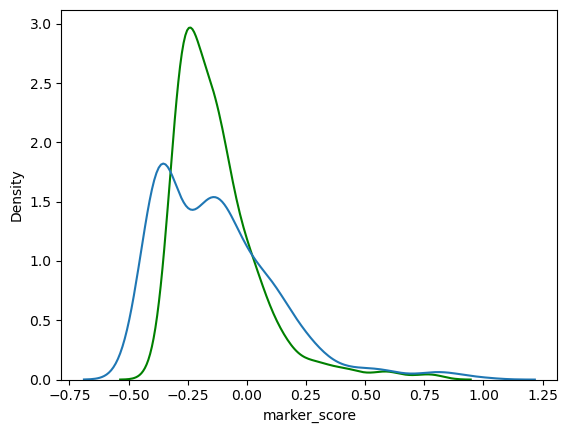

In [50]:
sb.kdeplot(y_pred, color = "g")
sb.kdeplot(y_test)

In [51]:
importances_cb = best_model_cb.feature_importances_
importances_cb = pd.Series(importances_cb, index=prot.columns)
importances_cb=importances_cb.sort_values(ascending=False)

print(importances_cb.head(10))

CD94         29.543653
CD62L         9.658502
CD16          6.346618
CD56          3.661246
CD44          3.395511
CD352         3.169537
CD161         2.405239
CD26          1.935067
CD224         1.857182
HLA-A-B-C     1.807438
dtype: float64


In [52]:
#df from the top 20 important markers
importances_cb=pd.DataFrame(importances_cb)
importances_cb_top=importances_cb[0:20]
importances_cb_top=importances_cb_top.T

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


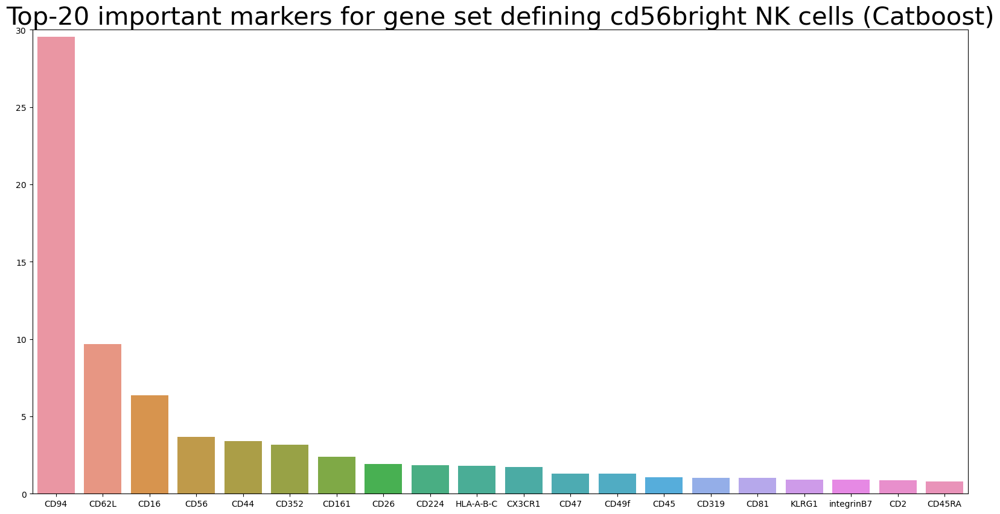

In [58]:
plt.figure(figsize=(20,10))
plt.ylim(0,30)
a=sb.barplot(data=importances_cb_top)

plt.title("Top-20 important markers for gene set defining cd56bright NK cells (Catboost)", fontsize = 30) ;




## 5. UMAP visualization

In [59]:
markers_prot = ['CD94', 'CD62L', 'CD16', 'CD56', 'CD44', 'CD352', 'CD161', 'CD26', 'CD224_prot']

In [60]:
#Computing a neighborhood of observations using latent space

sc.pp.neighbors(adata_neurips, use_rep="X_totalVI")   

sc.tl.umap(adata_neurips)

In [61]:
#selecting one sample from Neurips

sample =eg[eg.obs['POOL'] == "s4d1"].copy()


In [68]:
eg_nk

AnnData object with n_obs × n_vars = 2640 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47_prot', 'CD48', 'CD40', 'CD154', 'CD52_prot', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD16

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


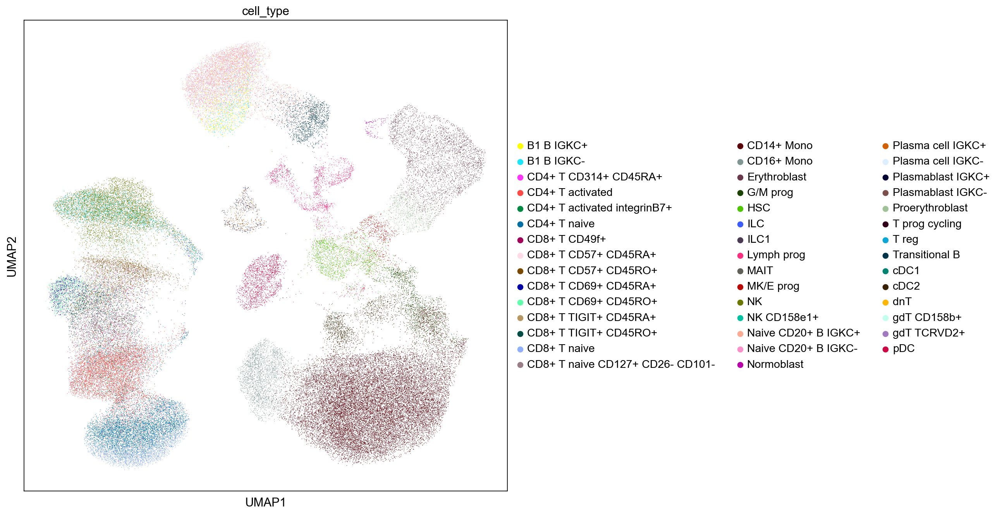

In [63]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips, color = ['cell_type'])

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


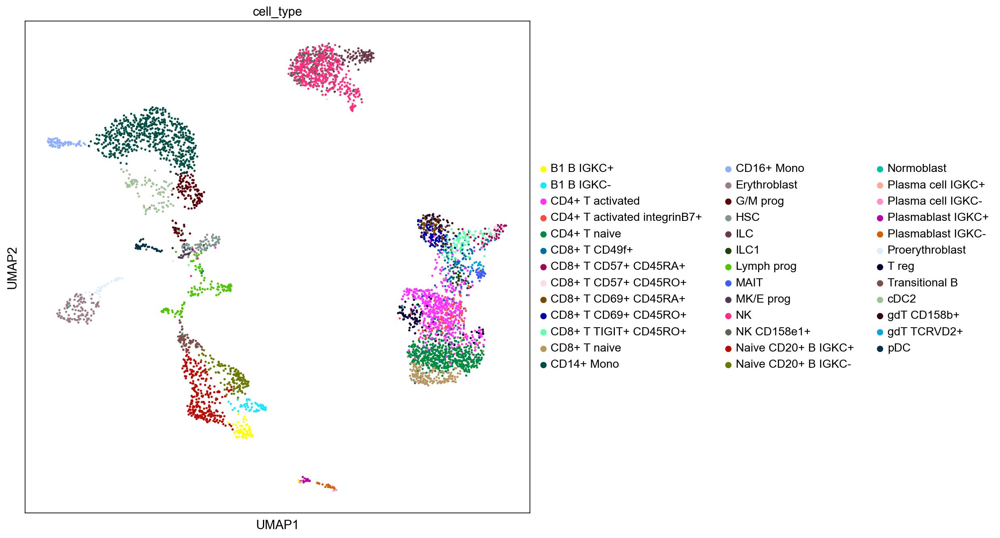

In [64]:
#only one sample

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(sample, color = ['cell_type'])

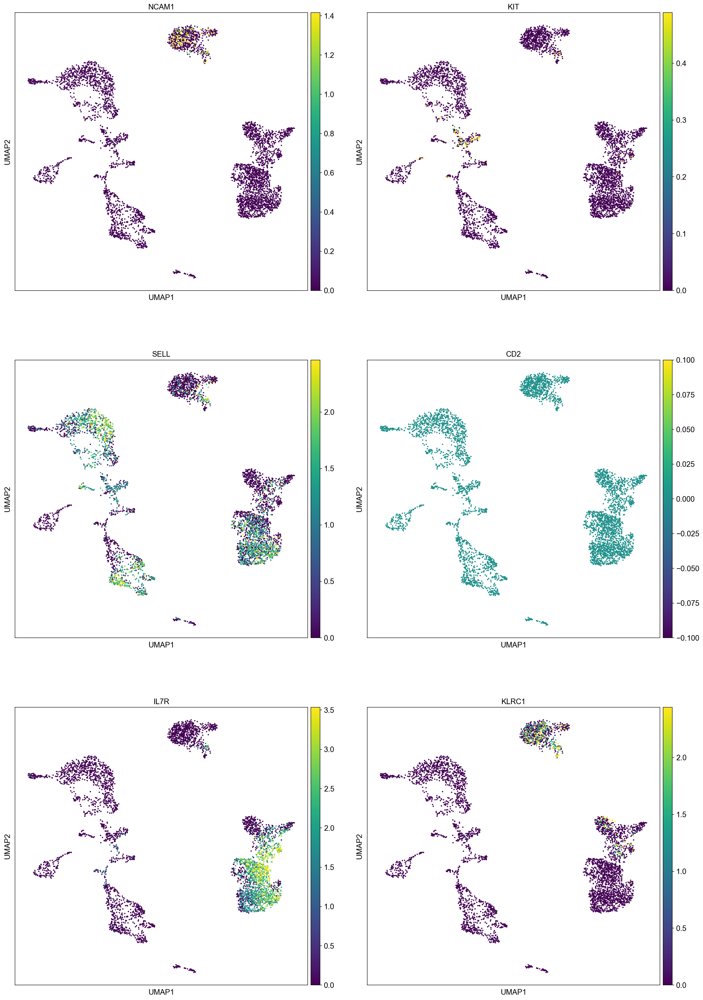

In [65]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(sample, color = markers,  vmax="p99", ncols = 2)

UMAPs above represent RNA markers for lt-NK cells (according to Yang et al., paper). 

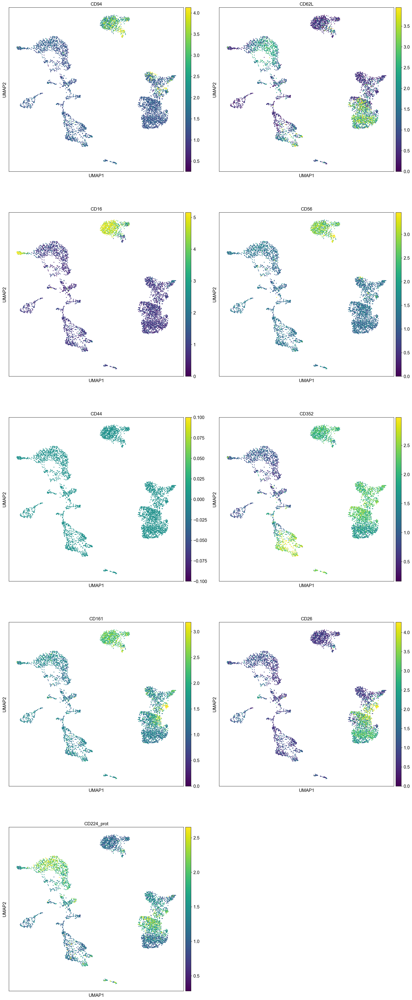

In [66]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(sample, color = markers_prot,  vmax="p99", ncols = 2)

Markers above are important features (surface proteins) identified by CatBoostReggressor.